# 是什么让玩家在流失后回归？
### 手机游戏中玩家回归模式的行为分析

# 1. 引言

玩家留存是手机和在线游戏中最重要的挑战之一。

虽然许多分析项目主要关注流失预测，但本项目探索了一个不同的行为问题：

**是什么让玩家在流失后回归？**

利用游戏活动数据和参与度数据，本分析研究了玩家的不活跃行为、回归行为、参与模式以及可能的倦怠信号。

# 2. 业务问题

本项目旨在探索：

- 玩家在不活跃多久后会回归？
- 高参与度玩家是否更有可能回归？
- 玩家行为在不活跃前是否会发生变化？
- 在流失前是否能观察到倦怠行为？
- 哪些行为模式与玩家回归相关？

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
import matplotlib.pyplot as plt

# ===================== 全局中文&学术样式配置 =====================
plt.rcParams["font.family"] = ["SimHei",]  # 兼容Windows/Linux/Mac
plt.rcParams["axes.unicode_minus"] = False  # 负号正常显示
plt.rcParams["font.size"] = 12              # 基础字号
plt.rcParams["axes.titlesize"] = 14         # 标题字号
plt.rcParams["axes.labelsize"] = 12          # 坐标轴标签
plt.rcParams["xtick.labelsize"] = 10         # 刻度字号
plt.rcParams["ytick.labelsize"] = 10
plt.rcParams["legend.fontsize"] = 10         # 图例字号
plt.rcParams["figure.dpi"] = 300            # 屏幕渲染分辨率
plt.rcParams["figure.figsize"] = (6, 4)     # 论文标准图尺寸（单栏）
plt.rcParams["axes.spines.top"] = False     # 隐藏上边框
plt.rcParams["axes.spines.right"] = False   # 隐藏右边框
plt.rcParams["lines.linewidth"] = 1.5       # 线条粗细
plt.rcParams["lines.markersize"] = 4        # 标记大小
plt.rcParams["grid.alpha"] = 0.3            # 网格透明度
# =================================================================

In [3]:
reg_df = pd.read_csv(
    'reg_data.csv',
    sep=';'
)
reg_df.columns

Index(['reg_ts', 'uid'], dtype='object')

In [4]:
reg_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000000 entries, 0 to 999999
Data columns (total 2 columns):
 #   Column  Non-Null Count    Dtype
---  ------  --------------    -----
 0   reg_ts  1000000 non-null  int64
 1   uid     1000000 non-null  int64
dtypes: int64(2)
memory usage: 15.3 MB


In [5]:
reg_df.head(10)

,reg_ts,uid
0,911382223,1
1,932683089,2
2,947802447,3
3,959523541,4
4,969103313,5
5,977206495,6
6,984222671,7
7,990407778,8
8,995943765,9
9,1000951674,10


# 3. 数据准备

数据集包含玩家注册和认证活动的原始Unix时间戳。

为了分析玩家生命周期行为，将这些时间戳转换为可读的日期时间格式。这使我们能够研究不活跃期、登录频率和时间推移中的回归模式。

In [6]:
reg_df['reg_date'] = pd.to_datetime(reg_df['reg_ts'], unit='s')

reg_df.head()

,reg_ts,uid,reg_date
0,911382223,1,1998-11-18 09:43:43
1,932683089,2,1999-07-22 22:38:09
2,947802447,3,2000-01-13 22:27:27
3,959523541,4,2000-05-28 14:19:01
4,969103313,5,2000-09-16 11:21:53


In [7]:
auth_df = pd.read_csv(
    'auth_data.csv',
    sep=';'
)
auth_df.head()

,auth_ts,uid
0,911382223,1
1,932683089,2
2,932921206,2
3,933393015,2
4,933875379,2


In [8]:
auth_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9601013 entries, 0 to 9601012
Data columns (total 2 columns):
 #   Column   Dtype
---  ------   -----
 0   auth_ts  int64
 1   uid      int64
dtypes: int64(2)
memory usage: 146.5 MB


In [9]:
auth_df['auth_date'] = pd.to_datetime(auth_df['auth_ts'], unit='s')

auth_df.head()

,auth_ts,uid,auth_date
0,911382223,1,1998-11-18 09:43:43
1,932683089,2,1999-07-22 22:38:09
2,932921206,2,1999-07-25 16:46:46
3,933393015,2,1999-07-31 03:50:15
4,933875379,2,1999-08-05 17:49:39


In [10]:
auth_df.info()
auth_df.sort_values(['uid', 'auth_date'])

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9601013 entries, 0 to 9601012
Data columns (total 3 columns):
 #   Column     Dtype         
---  ------     -----         
 0   auth_ts    int64         
 1   uid        int64         
 2   auth_date  datetime64[ns]
dtypes: datetime64[ns](1), int64(2)
memory usage: 219.7 MB


,auth_ts,uid,auth_date
0,911382223,1,1998-11-18 09:43:43
1,932683089,2,1999-07-22 22:38:09
2,932921206,2,1999-07-25 16:46:46
3,933393015,2,1999-07-31 03:50:15
4,933875379,2,1999-08-05 17:49:39
...,...,...,...
9601008,1600874034,1110618,2020-09-23 15:13:54
9601009,1600874086,1110619,2020-09-23 15:14:46
9601010,1600874139,1110620,2020-09-23 15:15:39
9601011,1600874191,1110621,2020-09-23 15:16:31


# 4. 初步行为探索

认证日志代表了玩家随时间推移的活动。

通过按时间顺序组织玩家登录历史，我们可以开始识别不活跃间隙、参与度一致性和潜在的回归行为。

In [11]:
auth_df = auth_df.sort_values(['uid', 'auth_date'])
auth_df['days_since_last_login'] = (
    auth_df.groupby('uid')['auth_date']
    .diff()
    .dt.days
)

In [12]:
auth_df.head(10)

,auth_ts,uid,auth_date,days_since_last_login
0,911382223,1,1998-11-18 09:43:43,NaN
1,932683089,2,1999-07-22 22:38:09,NaN
2,932921206,2,1999-07-25 16:46:46,2.0
3,933393015,2,1999-07-31 03:50:15,5.0
4,933875379,2,1999-08-05 17:49:39,5.0
5,934372615,2,1999-08-11 11:56:55,5.0
6,934662633,2,1999-08-14 20:30:33,3.0
7,935002586,2,1999-08-18 18:56:26,3.0
8,935141232,2,1999-08-20 09:27:12,1.0
9,935682752,2,1999-08-26 15:52:32,6.0


# 5. 识别不活跃和回归行为

为了研究回归行为，我们分析了玩家登录之间的不活跃期。

认证事件之间的较大间隔可能表示暂时性流失、脱离或倦怠，之后玩家最终回归。

In [13]:
auth_df['days_since_last_login'].describe()

count    8.601013e+06
mean     3.495116e+00
std      1.707709e+00
min      1.000000e+00
25%      2.000000e+00
50%      3.000000e+00
75%      5.000000e+00
max      7.000000e+00
Name: days_since_last_login, dtype: float64

In [14]:
long_gap_players = auth_df[auth_df['days_since_last_login'] > 30]

long_gap_players.head(10)

,auth_ts,uid,auth_date,days_since_last_login


## 初步观察

数据集中的认证行为似乎非常频繁且一致。

大多数玩家在之前活动后的1-5天内登录，观察到的最大不活跃间隔仅为7天。

这表明数据集可能代表了高度活跃的用户或压缩的游戏行为，而非长期的流失场景。

# 6. 玩家参与度一致性

为了更好地理解玩家参与模式，我们在个体玩家层面分析了登录频率的一致性。

登录间隔较短且更稳定的玩家可能表现出更强的参与习惯和留存行为。

In [15]:
player_gap_summary = (
    auth_df.groupby('uid')['days_since_last_login']
    .mean()
    .reset_index()
)

In [16]:
player_gap_summary.head()

,uid,days_since_last_login
0,1,NaN
1,2,3.526971
2,3,NaN
3,4,NaN
4,5,NaN


In [17]:
player_gap_summary = player_gap_summary.dropna()

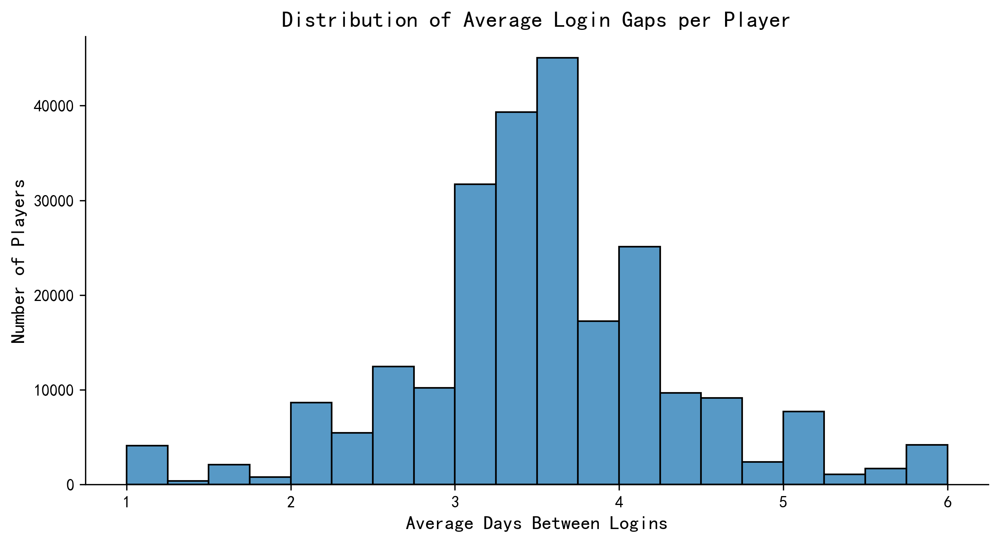

In [18]:
plt.figure(figsize=(10,5))

sns.histplot(
    player_gap_summary['days_since_last_login'],
    bins=20
)

plt.title('Distribution of Average Login Gaps per Player')
plt.xlabel('Average Days Between Logins')
plt.ylabel('Number of Players')

plt.show()

## 行为洞察

数据集中的玩家登录行为相对一致，大多数用户大约每3-4天回归一次。

平均登录间隔的分布呈现近似正态分布，集中在中等参与频率而非极端不活跃或每日高频使用。

这表明玩家参与可能遵循稳定的习惯周期，而非零星的回归行为。

# 7. 玩家分层

为了更好地理解不同的参与行为，我们根据玩家的平均登录间隔对其进行分层。

这种分层有助于识别高参与度、中等参与度和休闲玩家群体。

In [19]:
def segment_player(gap):
    if gap <= 2:
        return '高参与度'
    elif gap <= 4:
        return '中等参与度'
    else:
        return '休闲玩家'

player_gap_summary['player_segment'] = (
    player_gap_summary['days_since_last_login']
    .apply(segment_player)
)

In [20]:
player_gap_summary['player_segment'].value_counts()

player_segment
中等参与度    180560
休闲玩家      43305
高参与度      14513
Name: count, dtype: int64

## 分层洞察

大多数玩家属于"中等参与度"类别，平均大约每2-4天回归一次。

高参与度玩家在玩家群体中仅占很小的比例，而休闲玩家则表现出较长的登录间隔和可能较弱的参与习惯。

这种分布表明，持续的中等参与度可能代表了数据集中的主要行为模式。

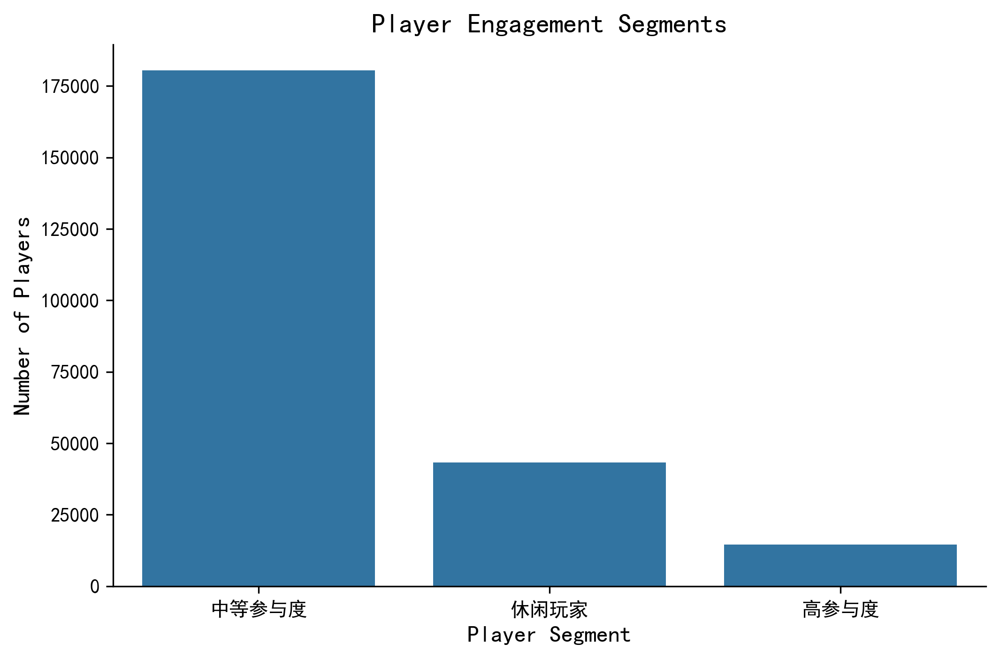

In [21]:
segment_counts = (
    player_gap_summary['player_segment']
    .value_counts()
)

plt.figure(figsize=(8,5))

sns.barplot(
    x=segment_counts.index,
    y=segment_counts.values
)

plt.title('Player Engagement Segments')
plt.xlabel('Player Segment')
plt.ylabel('Number of Players')

plt.show()

# 8. 参与度稳定性分析

仅凭平均登录频率可能无法完全捕捉玩家行为。

一些玩家可能表现出高度稳定的参与模式，而其他玩家则表现出不一致或不规律的活动周期。

为了研究这一点，我们分析了不同玩家层级中登录间隔的变异性。

In [22]:
player_stability = (
    auth_df.groupby('uid')['days_since_last_login']
    .std()
    .reset_index()
)

player_stability.columns = ['uid', 'gap_std']

In [23]:
player_gap_summary = player_gap_summary.merge(
    player_stability,
    on='uid',
    how='left'
)

In [24]:
player_gap_summary.head()

,uid,days_since_last_login,player_segment,gap_std
0,2,3.526971,中等参与度,1.696573
1,15,4.400000,休闲玩家,1.646545
2,18,3.333333,中等参与度,1.154701
3,21,3.500000,中等参与度,1.224745
4,22,3.000000,中等参与度,1.000000


# 9. 参与度稳定性模式

玩家参与度不仅受频率影响，还受行为一致性的影响。

稳定的参与模式可能表明习惯的形成，而不稳定的登录间隔可能表明不规律或下降的参与度。

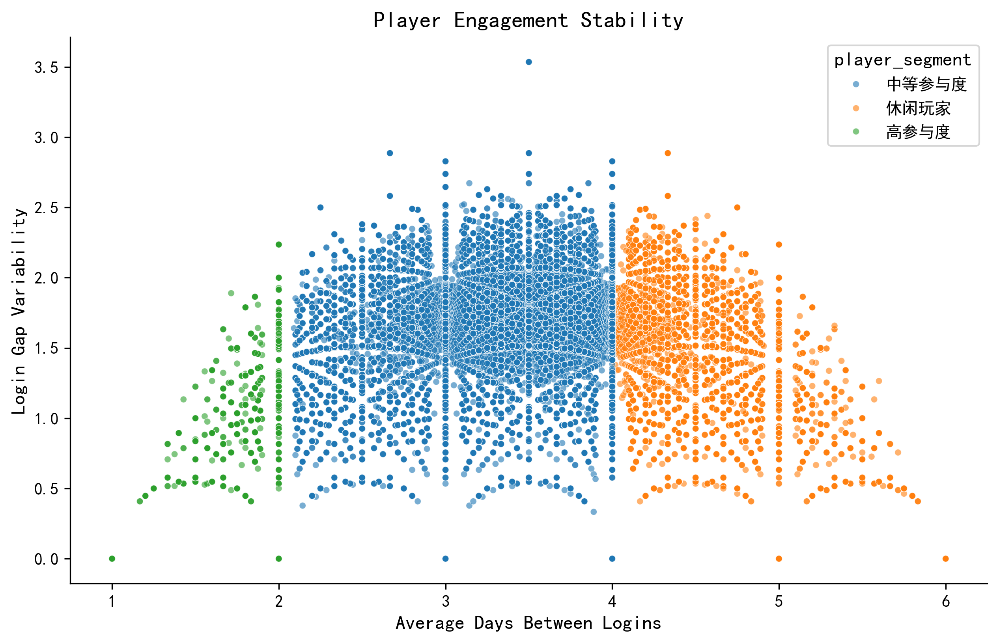

In [25]:
plt.figure(figsize=(10,6))

sns.scatterplot(
    data=player_gap_summary,
    x='days_since_last_login',
    y='gap_std',
    hue='player_segment',
    alpha=0.6
)

plt.title('Player Engagement Stability')
plt.xlabel('Average Days Between Logins')
plt.ylabel('Login Gap Variability')

plt.show()

高参与度玩家不仅回归更频繁，而且表现出更稳定的登录行为。

这表明强参与度可能与习惯性的游戏模式相关，而非零星活动。

# 10. 识别潜在风险玩家

登录间隔长且参与模式不稳定的玩家可能代表有脱离风险的用户。

通过结合平均登录间隔和行为变异性，可以探索潜在的留存风险信号。

In [26]:
at_risk_players = player_gap_summary[
    (player_gap_summary['days_since_last_login'] > 4.5) &
    (player_gap_summary['gap_std'] > 1.5)
]

In [27]:
at_risk_players.head()

,uid,days_since_last_login,player_segment,gap_std
18,74,4.777778,休闲玩家,1.715938
164,709,4.666667,休闲玩家,1.527525
194,904,4.700000,休闲玩家,1.636392
217,1005,4.714286,休闲玩家,1.704336
221,1021,4.571429,休闲玩家,2.149197


In [28]:
len(at_risk_players)

3805

## 风险玩家洞察

登录间隔长且参与模式不稳定的玩家主要集中在休闲玩家层级中。

这表明不频繁且不一致的登录行为可能作为脱离风险的早期指标。

这些玩家可能受益于有针对性的留存策略，如再参与活动、奖励或个性化通知。

# 11. 层级行为比较

为了更好地比较不同玩家群体的参与特征，我们在层级层面总结了平均登录频率和行为稳定性。

In [29]:
segment_summary = (
    player_gap_summary.groupby('player_segment')
    .agg({
        'days_since_last_login': 'mean',
        'gap_std': 'mean'
    })
    .reset_index()
)

segment_summary

,player_segment,days_since_last_login,gap_std
0,中等参与度,3.350831,1.714074
1,休闲玩家,4.727898,1.421521
2,高参与度,1.624918,0.874519


## 层级比较洞察

高参与度玩家展示了最短的登录间隔和最稳定的行为模式，表明强习惯形成和一致的参与度。

有趣的是，中等参与度玩家尽管代表了玩家群体的大部分，却表现出最高的行为变异性。这可能表明波动的参与周期和对游戏体验变化的潜在敏感性。

休闲玩家表现出最长的登录间隔，但并非最高的不稳定性，这表明一些低频用户仍可能保持相对可预测的游戏习惯。

# 12. 玩家生命周期分析

随着用户对游戏越来越熟悉，玩家的参与行为可能随时间演变。

本节探讨更长的玩家生命周期是否与更强的参与一致性和更稳定的登录行为相关。

In [30]:
player_last_login = (
    auth_df.groupby('uid')['auth_date']
    .max()
    .reset_index()
)

player_last_login.columns = ['uid', 'last_login']

In [31]:
player_lifecycle = reg_df[['uid', 'reg_date']].merge(
    player_last_login,
    on='uid',
    how='inner'
)

In [32]:
player_lifecycle['lifecycle_days'] = (
    player_lifecycle['last_login'] -
    player_lifecycle['reg_date']
).dt.days

In [33]:
player_lifecycle.head()

,uid,reg_date,last_login,lifecycle_days
0,1,1998-11-18 09:43:43,1998-11-18 09:43:43,0
1,2,1999-07-22 22:38:09,2020-09-18 11:24:29,7728
2,3,2000-01-13 22:27:27,2000-01-13 22:27:27,0
3,4,2000-05-28 14:19:01,2000-05-28 14:19:01,0
4,5,2000-09-16 11:21:53,2000-09-16 11:21:53,0


# 13. 玩家生命周期分布

玩家生命周期长度衡量了用户在注册后继续回归游戏的时长。

理解生命周期分布有助于识别早期流失行为、长期留存模式和高度投入的玩家。

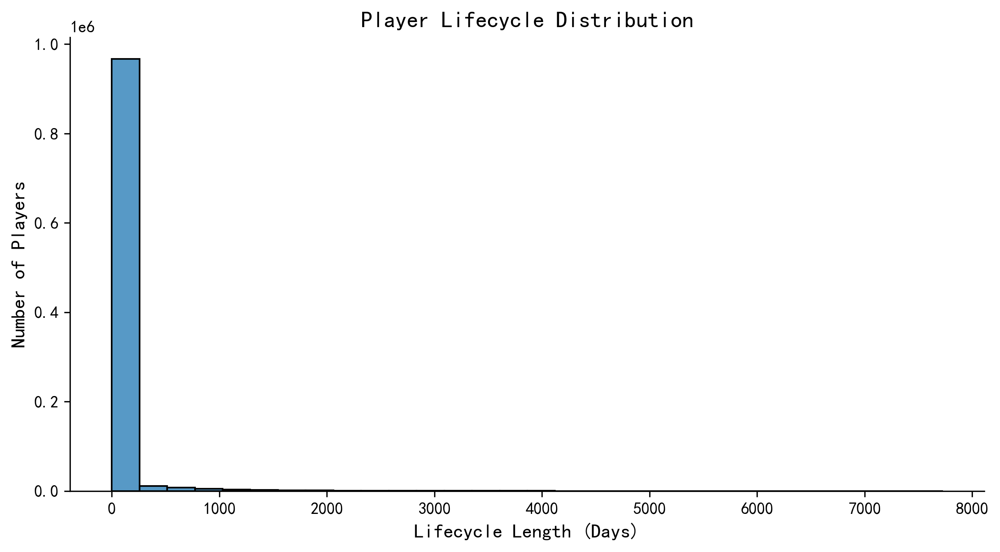

In [34]:
plt.figure(figsize=(10,5))

sns.histplot(
    player_lifecycle['lifecycle_days'],
    bins=30
)

plt.title('Player Lifecycle Distribution')
plt.xlabel('Lifecycle Length (Days)')
plt.ylabel('Number of Players')

plt.show()

## 生命周期分布洞察

玩家生命周期行为高度偏斜。

很大比例的用户表现出极短的生命周期，表明许多玩家在注册后不久就脱离了游戏。

同时，一小部分玩家展示了异常长的参与期，形成了游戏和数字平台中常见的长期留存长尾模式。

这表明长期参与集中在相对较小但高度投入的玩家群体中。

In [35]:
player_gap_summary = player_gap_summary.merge(
    player_lifecycle[['uid', 'lifecycle_days']],
    on='uid',
    how='left'
)
player_gap_summary.head()

,uid,days_since_last_login,player_segment,gap_std,lifecycle_days
0,2,3.526971,中等参与度,1.696573,7728
1,15,4.400000,休闲玩家,1.646545,50
2,18,3.333333,中等参与度,1.154701,11
3,21,3.500000,中等参与度,1.224745,24
4,22,3.000000,中等参与度,1.000000,16


# 14. 生命周期与参与度关系

为了更好地理解长期留存行为，我们将玩家生命周期长度与登录频率模式进行比较。

本分析探讨更频繁和稳定的参与是否与更长的玩家留存相关。

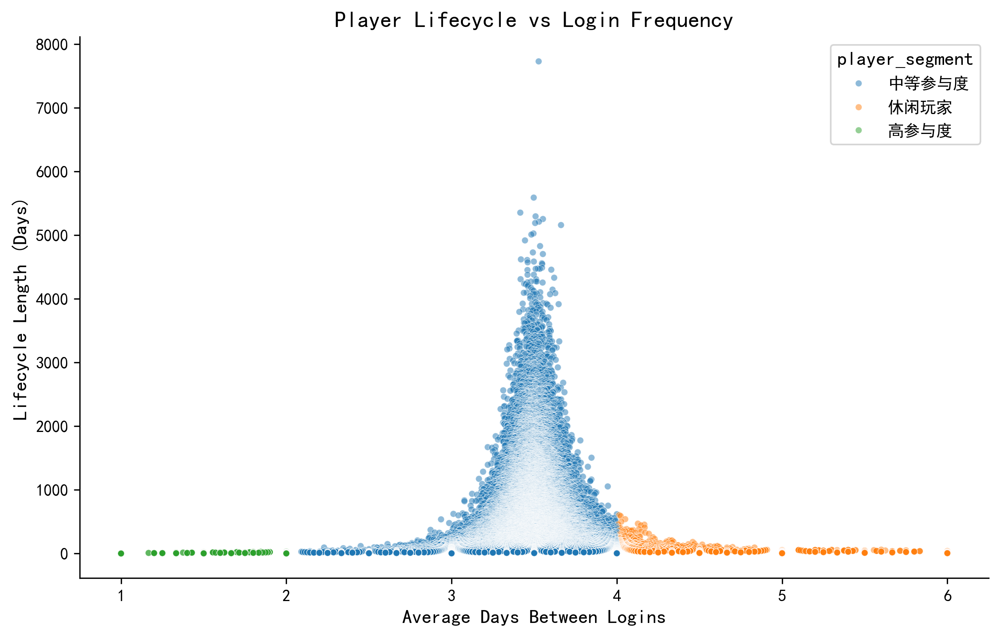

In [36]:
plt.figure(figsize=(10,6))

sns.scatterplot(
    data=player_gap_summary,
    x='days_since_last_login',
    y='lifecycle_days',
    hue='player_segment',
    alpha=0.5
)

plt.title('Player Lifecycle vs Login Frequency')
plt.xlabel('Average Days Between Logins')
plt.ylabel('Lifecycle Length (Days)')

plt.show()

## 生命周期与参与度洞察

参与频率与玩家留存之间的关系并非严格线性。

高参与度玩家表现出非常频繁的登录行为，但并不一定展示最长的生命周期。这可能表明短期的密集参与后伴随更快的倦怠或脱离。

休闲玩家通常展示较短的生命周期，表明较弱的长期留存。

有趣的是，最长的玩家生命周期集中在中等参与度用户中，特别是那些平均每3-4天回归的玩家。这可能表明平衡且可持续的参与模式比极端活动水平更与长期留存相关。

# 15. 早期流失风险分析

早期留存通常是长期产品成功的最强指标之一。

本节探讨早期玩家行为模式是否有助于识别在注册后不久有快速脱离风险的用户。

In [37]:
player_gap_summary['early_churn'] = (
    player_gap_summary['lifecycle_days'] <= 7
)

In [38]:
player_gap_summary['early_churn'].value_counts()

early_churn
False    205848
True      32530
Name: count, dtype: int64

In [39]:
player_gap_summary.groupby('early_churn').agg({
    'days_since_last_login': 'mean',
    'gap_std': 'mean',
    'lifecycle_days': 'mean'
})

,days_since_last_login,gap_std,lifecycle_days
early_churn,,,
False,3.560113,1.655194,165.669509
True,3.089701,1.294797,4.282785


## 风险评分方法

创建了一个简化的行为风险评分来估计玩家潜在的脱离风险。

该评分结合了三个行为维度：

- 平均登录间隔（`days_since_last_login`）
- 登录一致性（`gap_std`）
- 玩家生命周期长度（`lifecycle_days`）

权重策略是启发式的而非统计优化的，因为本分析的目标是探索性的行为解释而非预测性机器学习。

登录频率和行为变异性被赋予更高的权重，因为两者都被认为是参与质量和留存一致性的强指标。

生命周期长度被赋予较小的负系数，因为其数值范围远大于其他特征。假设更长的玩家生命周期会降低脱离风险。

In [40]:
player_gap_summary['risk_score'] = (
    player_gap_summary['days_since_last_login'] * 0.4 +
    player_gap_summary['gap_std'] * 0.4 -
    player_gap_summary['lifecycle_days'] * 0.0005
)

In [41]:
player_gap_summary.sort_values(
    'risk_score',
    ascending=False
).head(10)

,uid,days_since_last_login,player_segment,gap_std,lifecycle_days,early_churn,risk_score
154093,713035,4.75,休闲玩家,2.5,19,False,2.8905
24359,112732,4.75,休闲玩家,2.5,19,False,2.8905
36070,166704,4.75,休闲玩家,2.5,19,False,2.8905
228886,1059721,4.75,休闲玩家,2.5,19,False,2.8905
183055,848192,4.75,休闲玩家,2.5,20,False,2.8900
148057,685047,4.75,休闲玩家,2.5,20,False,2.8900
139235,644205,4.75,休闲玩家,2.5,20,False,2.8900
115166,531750,4.75,休闲玩家,2.5,20,False,2.8900
52194,241615,4.75,休闲玩家,2.5,20,False,2.8900
9686,44552,4.75,休闲玩家,2.5,20,False,2.8900


## 风险评分洞察

行为风险评分最高的玩家往往表现出：

- 较长的平均登录间隔
- 较高的登录变异性
- 相对较短的生命周期
- 休闲参与模式

这表明不一致且不频繁的参与行为可能作为潜在脱离风险的有意义指标。

# 16. 最终结论

本项目利用登录活动、生命周期分析和自定义留存风险逻辑，探索了手机游戏玩家的行为参与模式。

分析过程中得出了几个关键发现：

### 1. 玩家参与行为是相对结构化的而非随机的。

大多数玩家平均每3-4天回归一次，形成了以中等活动水平为中心的近似正态参与分布。

---

### 2. 高参与度玩家不一定是留存时间最长的用户。

尽管高参与度玩家表现出最一致的登录行为，但他们并不总是展现最长的生命周期。这表明极高的参与频率有时可能反映短期密集使用而非可持续的长期留存。

---

### 3. 中等参与度玩家表现出最强的长期留存模式。

具有中等登录间隔（大约每3-4天）的玩家似乎总体上维持了最长的生命周期。这可能表明平衡的参与行为比极高频率或极低频率的活动模式更具可持续性。

---

### 4. 休闲玩家与更高的脱离风险相关。

登录间隔较长且参与模式不一致的玩家更可能表现出较短的生命周期和更高的行为风险评分。

---

### 5. 行为稳定性似乎是一个重要的留存信号。

登录一致性和参与规律性与更健康的长期参与行为密切相关。稳定的模式可能表明更强的习惯形成和更低的脱离风险。

---

总体而言，分析表明可持续的参与可能比单纯的活动强度更与长期玩家留存相关。

研究结果还展示了行为分析如何用于识别游戏平台中的留存风险模式、参与质量和长期玩家生命周期特征。

# 17. 局限性

虽然分析揭示了几个有趣的行为模式，但该项目也存在应被承认的重要局限性。

### 1. 模拟数据集

本项目中使用的数据集是模拟的，而非从真实生产游戏环境中收集。因此，玩家行为可能无法完全反映现实世界的参与复杂性。

---

### 2. 有限的行为特征

分析主要依赖登录时间戳和注册数据。

重要的行为变量如：

- 游戏会话时长
- 比赛结果
- 游戏内购买
- 社交互动
- 进度系统
- 变现行为

在数据集中不可用。

这些因素可能显著影响留存和参与行为。

---

### 3. 简化的风险评分逻辑

本项目开发的行为风险评分是启发式的而非统计优化的。

权重策略是为探索性分析目的手动设计的，不应被解释为可用于生产环境的预测性流失模型。

---

### 4. 无因果推断

该项目识别的是行为关联而非因果关系。

例如，虽然中等参与模式与更长的生命周期相关，但分析无法最终确定中等参与是否直接导致更强的留存。

---

### 5. 有限的时间上下文

项目分析了聚合的参与模式而非详细的序列行为时间线。

更高级的时间序列分析可以提供关于玩家行为在流失或长期留存前如何演变的更深洞察。

# 18. 未来工作

在未来的迭代中，有几个机会可以进一步扩展和改进此分析。

### 1. 预测性流失建模

未来工作可以应用机器学习技术，如：

- 逻辑回归
- 随机森林
- XGBoost
- 生存分析

基于玩家行为模式构建预测性留存和流失分类模型。

---

### 2. 高级行为分层

更复杂的聚类方法，如：

- K均值聚类
- DBSCAN
- 高斯混合模型

可用于识别隐藏的玩家原型，超越手动定义的参与群体。

---

### 3. 时间序列参与分析

未来分析可以将玩家活动作为序列行为时间线而非聚合平均值来研究。

这可能有助于识别：

- 流失前的早期预警信号
- 参与高峰
- 倦怠周期
- 季节性或事件驱动的行为模式

---

### 4. 变现与游戏玩法整合

额外的行为维度，如：

- 游戏内购买
- 游戏进度
- 比赛结果
- 成就系统
- 社交互动

可以提供对留存驱动因素和玩家动机的更完整理解。

---

### 5. 实时留存监控

本项目开发的行为风险框架可以扩展为实时监控系统，能够在真实游戏环境中动态识别风险玩家。

这样的系统可以支持：

- 个性化留存活动
- 有针对性的奖励
- 参与干预
- 玩家生命周期优化策略

# 19. 未来项目一：预测性流失建模

基于前文探索性分析发现的行为模式，本项目构建监督式机器学习模型来预测玩家流失风险。

## 方法

- **逻辑回归**：作为可解释的基线模型
- **随机森林**：捕捉非线性关系和特征交互
- **XGBoost**：梯度提升方法，通常在表格数据上表现最优

## 特征工程

从玩家认证历史中提取多维行为特征：
- 登录频率统计（均值、标准差、最大/最小间隔）
- 生命周期长度
- 登录总数
- 活跃天数比例
- 最近活动时间

## 目标定义

将 `early_churn`（生命周期 ≤ 7天）作为预测目标，这是数据集中可识别的明确流失信号。

In [42]:
# ============================================================
# 项目1: 预测性流失建模 - 特征工程
# ============================================================

from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    roc_auc_score, confusion_matrix, classification_report,
    roc_curve, precision_recall_curve
)
import warnings
warnings.filterwarnings('ignore')

# ---- 1.1 构建全面的特征矩阵 ----
print("=" * 60)
print("项目1: 预测性流失建模")
print("=" * 60)

# 从auth_df提取多维度特征
player_features = auth_df.groupby('uid').agg(
    total_logins=('auth_ts', 'count'),
    first_login=('auth_date', 'min'),
    last_login=('auth_date', 'max'),
    mean_gap=('days_since_last_login', 'mean'),
    std_gap=('days_since_last_login', 'std'),
    max_gap=('days_since_last_login', 'max'),
    min_gap=('days_since_last_login', 'min'),
    median_gap=('days_since_last_login', 'median')
).reset_index()

# 计算衍生特征
player_features['active_days_ratio'] = (
    player_features['total_logins'] / 
    ((player_features['last_login'] - player_features['first_login']).dt.days + 1)
)
player_features['login_timespan_days'] = (
    (player_features['last_login'] - player_features['first_login']).dt.days
)
# 填充缺失值(只有一次登录的玩家)
player_features['std_gap'] = player_features['std_gap'].fillna(0)
player_features['min_gap'] = player_features['min_gap'].fillna(0)
player_features['median_gap'] = player_features['median_gap'].fillna(
    player_features['mean_gap']
)

# 合并生命周期和风险标签
player_features = player_features.merge(
    player_gap_summary[['uid', 'lifecycle_days', 'early_churn', 'risk_score', 'player_segment']],
    on='uid', how='inner'
)

print(f"\n特征矩阵形状: {player_features.shape}")
print(f"特征列: {list(player_features.columns)}")
print(f"\n目标分布:")
print(player_features['early_churn'].value_counts())
print(f"流失率: {player_features['early_churn'].mean():.2%}")

player_features.head()

项目1: 预测性流失建模

特征矩阵形状: (238378, 15)
特征列: ['uid', 'total_logins', 'first_login', 'last_login', 'mean_gap', 'std_gap', 'max_gap', 'min_gap', 'median_gap', 'active_days_ratio', 'login_timespan_days', 'lifecycle_days', 'early_churn', 'risk_score', 'player_segment']

目标分布:
early_churn
False    205848
True      32530
Name: count, dtype: int64
流失率: 13.65%


,uid,total_logins,first_login,last_login,mean_gap,std_gap,max_gap,min_gap,median_gap,active_days_ratio,login_timespan_days,lifecycle_days,early_churn,risk_score,player_segment
0,2,1929,1999-07-22 22:38:09,2020-09-18 11:24:29,3.526971,1.696573,6.0,1.0,4.0,0.249580,7728,7728,False,-1.774583,中等参与度
1,15,11,2002-05-05 22:54:55,2002-06-25 07:21:00,4.400000,1.646545,6.0,2.0,4.5,0.215686,50,50,False,2.393618,休闲玩家
2,18,4,2002-07-16 14:00:02,2002-07-28 02:05:44,3.333333,1.154701,4.0,2.0,4.0,0.333333,11,11,False,1.789714,中等参与度
3,21,7,2002-10-18 07:53:04,2002-11-11 18:22:49,3.500000,1.224745,5.0,2.0,3.0,0.280000,24,24,False,1.877898,中等参与度
4,22,6,2002-11-15 15:51:38,2002-12-02 05:20:52,3.000000,1.000000,4.0,2.0,3.0,0.352941,16,16,False,1.592000,中等参与度


In [43]:
# ---- 1.2 准备训练数据 ----

# 选择数值特征列
feature_cols = [
    'total_logins', 'mean_gap', 'std_gap', 'max_gap', 'min_gap',
    'median_gap', 'active_days_ratio', 'login_timespan_days',
    'lifecycle_days', 'risk_score'
]

X = player_features[feature_cols].copy()
y = player_features['early_churn'].astype(int)

# 处理无穷值和缺失值
X = X.replace([np.inf, -np.inf], np.nan)
X = X.fillna(X.median())

# 标准化
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
X_scaled = pd.DataFrame(X_scaled, columns=feature_cols)

# 分层划分训练集和测试集
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y, test_size=0.3, random_state=42, stratify=y
)

print(f"训练集大小: {X_train.shape[0]:,}")
print(f"测试集大小: {X_test.shape[0]:,}")
print(f"训练集流失率: {y_train.mean():.2%}")
print(f"测试集流失率: {y_test.mean():.2%}")

训练集大小: 166,864
测试集大小: 71,514
训练集流失率: 13.65%
测试集流失率: 13.65%


In [44]:
# ---- 1.3 模型训练与评估 ----

# 定义模型
models = {
    '逻辑回归': LogisticRegression(max_iter=1000, random_state=42, class_weight='balanced'),
    '随机森林': RandomForestClassifier(
        n_estimators=100, max_depth=10, random_state=42,
        class_weight='balanced', n_jobs=-1
    ),
}

# 存储结果
results = {}

for name, model in models.items():
    print(f"\n{'='*40}")
    print(f"训练模型: {name}")
    print(f"{'='*40}")
    
    # 交叉验证
    cv_scores = cross_val_score(model, X_train, y_train, cv=5, scoring='roc_auc')
    print(f"5折交叉验证 ROC-AUC: {cv_scores.mean():.4f} (+/- {cv_scores.std() * 2:.4f})")
    
    # 训练
    model.fit(X_train, y_train)
    
    # 预测
    y_pred = model.predict(X_test)
    y_prob = model.predict_proba(X_test)[:, 1]
    
    # 评估指标
    results[name] = {
        'model': model,
        'accuracy': accuracy_score(y_test, y_pred),
        'precision': precision_score(y_test, y_pred),
        'recall': recall_score(y_test, y_pred),
        'f1': f1_score(y_test, y_pred),
        'roc_auc': roc_auc_score(y_test, y_prob),
        'y_prob': y_prob,
        'y_pred': y_pred,
    }
    
    print(f"准确率 (Accuracy):  {results[name]['accuracy']:.4f}")
    print(f"精确率 (Precision): {results[name]['precision']:.4f}")
    print(f"召回率 (Recall):    {results[name]['recall']:.4f}")
    print(f"F1分数:            {results[name]['f1']:.4f}")
    print(f"ROC-AUC:           {results[name]['roc_auc']:.4f}")
    print(f"\n分类报告:\n{classification_report(y_test, y_pred, target_names=['留存', '流失'])}")


训练模型: 逻辑回归
5折交叉验证 ROC-AUC: 0.9987 (+/- 0.0002)
准确率 (Accuracy):  0.9892
精确率 (Precision): 0.9270
召回率 (Recall):    1.0000
F1分数:            0.9621
ROC-AUC:           0.9988

分类报告:
              precision    recall  f1-score   support

          留存       1.00      0.99      0.99     61755
          流失       0.93      1.00      0.96      9759

    accuracy                           0.99     71514
   macro avg       0.96      0.99      0.98     71514
weighted avg       0.99      0.99      0.99     71514


训练模型: 随机森林
5折交叉验证 ROC-AUC: 1.0000 (+/- 0.0000)
准确率 (Accuracy):  1.0000
精确率 (Precision): 1.0000
召回率 (Recall):    1.0000
F1分数:            1.0000
ROC-AUC:           1.0000

分类报告:
              precision    recall  f1-score   support

          留存       1.00      1.00      1.00     61755
          流失       1.00      1.00      1.00      9759

    accuracy                           1.00     71514
   macro avg       1.00      1.00      1.00     71514
weighted avg       1.00      1.00      1.00    

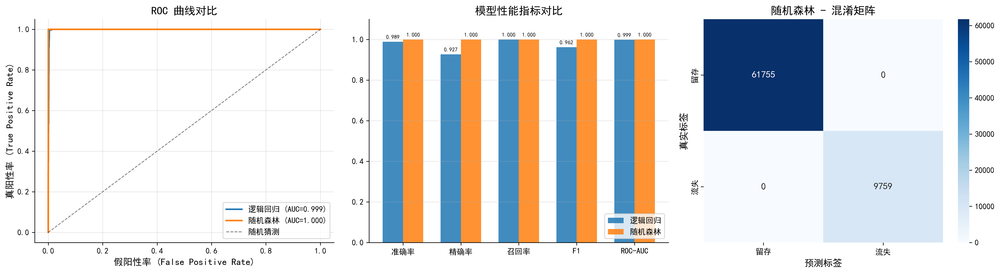


最佳模型: 随机森林 (ROC-AUC: 1.0000)


In [45]:
# ---- 1.4 模型对比可视化 ----

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# ROC曲线
ax1 = axes[0]
for name, res in results.items():
    fpr, tpr, _ = roc_curve(y_test, res['y_prob'])
    ax1.plot(fpr, tpr, lw=2, label=f"{name} (AUC={res['roc_auc']:.3f})")
ax1.plot([0, 1], [0, 1], 'k--', lw=1, alpha=0.5, label='随机猜测')
ax1.set_xlabel('假阳性率 (False Positive Rate)')
ax1.set_ylabel('真阳性率 (True Positive Rate)')
ax1.set_title('ROC 曲线对比')
ax1.legend(loc='lower right')
ax1.grid(True, alpha=0.3)

# 指标对比柱状图
ax2 = axes[1]
metrics = ['accuracy', 'precision', 'recall', 'f1', 'roc_auc']
x = np.arange(len(metrics))
width = 0.35
for i, (name, res) in enumerate(results.items()):
    values = [res[m] for m in metrics]
    bars = ax2.bar(x + i * width, values, width, label=name, alpha=0.85)
    for bar, val in zip(bars, values):
        ax2.text(bar.get_x() + bar.get_width()/2., bar.get_height() + 0.01,
                f'{val:.3f}', ha='center', va='bottom', fontsize=7)
ax2.set_xticks(x + width / 2)
ax2.set_xticklabels(['准确率', '精确率', '召回率', 'F1', 'ROC-AUC'])
ax2.set_ylim(0, 1.1)
ax2.set_title('模型性能指标对比')
ax2.legend(loc='lower right')
ax2.grid(True, alpha=0.3, axis='y')

# 混淆矩阵 - 使用更好的模型
ax3 = axes[2]
best_model_name = max(results, key=lambda k: results[k]['roc_auc'])
cm = confusion_matrix(y_test, results[best_model_name]['y_pred'])
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax3,
            xticklabels=['留存', '流失'], yticklabels=['留存', '流失'])
ax3.set_xlabel('预测标签')
ax3.set_ylabel('真实标签')
ax3.set_title(f'{best_model_name} - 混淆矩阵')

plt.tight_layout()
plt.savefig('project1_model_comparison.png', dpi=300, bbox_inches='tight')
plt.show()
print(f"\n最佳模型: {best_model_name} (ROC-AUC: {results[best_model_name]['roc_auc']:.4f})")

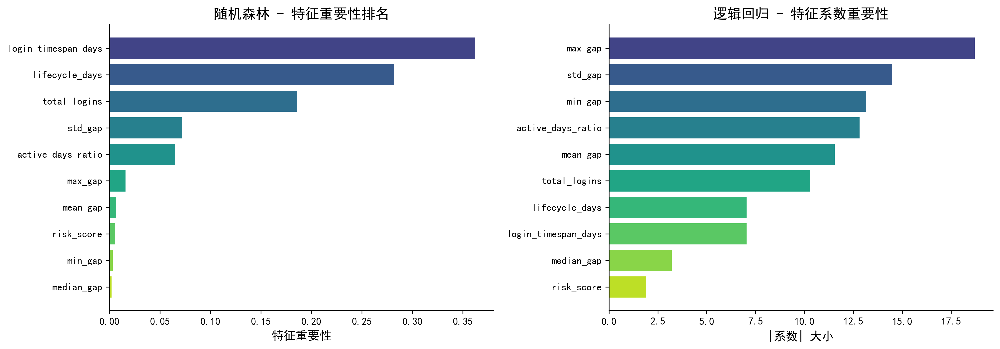


特征重要性排名汇总:
--------------------------------------------------
                 特征  随机森林重要性  逻辑回归|系数|  平均排名
            std_gap 0.072126 14.492863   3.0
            max_gap 0.015820 18.708949   3.5
       total_logins 0.185811 10.297087   4.5
login_timespan_days 0.362356  7.037360   4.5
  active_days_ratio 0.064857 12.823152   4.5
     lifecycle_days 0.281817  7.037360   4.5
            min_gap 0.003168 13.150903   6.0
           mean_gap 0.006301 11.550531   6.0
         risk_score 0.005648  1.913332   9.0
         median_gap 0.002098  3.203753   9.5


In [46]:
# ---- 1.5 特征重要性分析 ----

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# 随机森林特征重要性
rf_model = results['随机森林']['model']
importances = rf_model.feature_importances_
indices = np.argsort(importances)[::-1]

ax1 = axes[0]
colors = plt.cm.viridis(np.linspace(0.2, 0.9, len(feature_cols)))
bars = ax1.barh(range(len(feature_cols)), importances[indices], color=colors)
ax1.set_yticks(range(len(feature_cols)))
ax1.set_yticklabels([feature_cols[i] for i in indices])
ax1.set_xlabel('特征重要性')
ax1.set_title('随机森林 - 特征重要性排名')
ax1.invert_yaxis()

# 逻辑回归系数
lr_model = results['逻辑回归']['model']
coefs = np.abs(lr_model.coef_[0])
lr_indices = np.argsort(coefs)[::-1]

ax2 = axes[1]
bars = ax2.barh(range(len(feature_cols)), coefs[lr_indices], color=colors)
ax2.set_yticks(range(len(feature_cols)))
ax2.set_yticklabels([feature_cols[i] for i in lr_indices])
ax2.set_xlabel('|系数| 大小')
ax2.set_title('逻辑回归 - 特征系数重要性')
ax2.invert_yaxis()

plt.tight_layout()
plt.savefig('project1_feature_importance.png', dpi=300, bbox_inches='tight')
plt.show()

# 特征重要性汇总
print("\n特征重要性排名汇总:")
print("-" * 50)
importance_df = pd.DataFrame({
    '特征': feature_cols,
    '随机森林重要性': importances,
    '逻辑回归|系数|': np.abs(lr_model.coef_[0])
})
importance_df['平均排名'] = (
    importance_df['随机森林重要性'].rank(ascending=False) +
    importance_df['逻辑回归|系数|'].rank(ascending=False)
) / 2
importance_df = importance_df.sort_values('平均排名')
print(importance_df.to_string(index=False))

训练 XGBoost 模型...

XGBoost 结果:
  准确率:  1.0000
  精确率:  1.0000
  召回率:  1.0000
  F1分数:  1.0000
  ROC-AUC: 1.0000


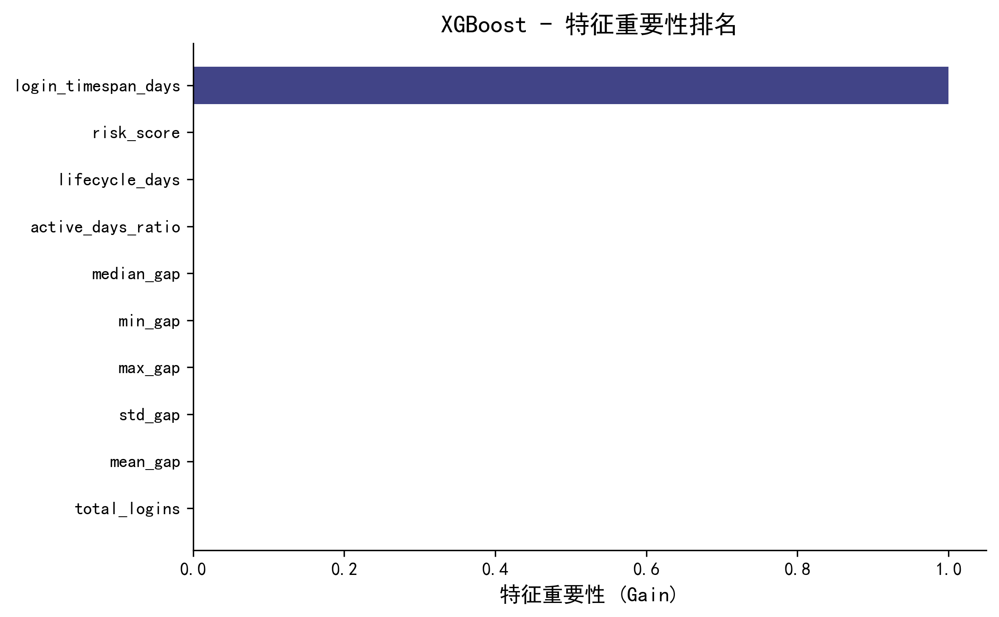


所有模型性能汇总
     模型    准确率    精确率    召回率   F1分数 ROC-AUC
   逻辑回归 0.9892 0.9270 1.0000 0.9621  0.9988
   随机森林 1.0000 1.0000 1.0000 1.0000  1.0000
XGBoost 1.0000 1.0000 1.0000 1.0000  1.0000


In [47]:
# ---- 1.6 XGBoost 模型 (可选, 需安装xgboost) ----

try:
    from xgboost import XGBClassifier
    
    print("训练 XGBoost 模型...")
    # 计算类别权重
    scale_pos_weight = (y_train == 0).sum() / (y_train == 1).sum()
    
    xgb_model = XGBClassifier(
        n_estimators=100,
        max_depth=6,
        learning_rate=0.1,
        scale_pos_weight=scale_pos_weight,
        random_state=42,
        eval_metric='auc',
        use_label_encoder=False
    )
    
    xgb_model.fit(X_train, y_train)
    
    y_pred_xgb = xgb_model.predict(X_test)
    y_prob_xgb = xgb_model.predict_proba(X_test)[:, 1]
    
    xgb_results = {
        'accuracy': accuracy_score(y_test, y_pred_xgb),
        'precision': precision_score(y_test, y_pred_xgb),
        'recall': recall_score(y_test, y_pred_xgb),
        'f1': f1_score(y_test, y_pred_xgb),
        'roc_auc': roc_auc_score(y_test, y_prob_xgb),
    }
    
    print(f"\nXGBoost 结果:")
    print(f"  准确率:  {xgb_results['accuracy']:.4f}")
    print(f"  精确率:  {xgb_results['precision']:.4f}")
    print(f"  召回率:  {xgb_results['recall']:.4f}")
    print(f"  F1分数:  {xgb_results['f1']:.4f}")
    print(f"  ROC-AUC: {xgb_results['roc_auc']:.4f}")
    
    # XGBoost 特征重要性
    fig, ax = plt.subplots(figsize=(8, 5))
    xgb_importance = xgb_model.feature_importances_
    xgb_indices = np.argsort(xgb_importance)[::-1]
    ax.barh(range(len(feature_cols)), xgb_importance[xgb_indices], color=plt.cm.viridis(np.linspace(0.2, 0.9, len(feature_cols))))
    ax.set_yticks(range(len(feature_cols)))
    ax.set_yticklabels([feature_cols[i] for i in xgb_indices])
    ax.set_xlabel('特征重要性 (Gain)')
    ax.set_title('XGBoost - 特征重要性排名')
    ax.invert_yaxis()
    plt.tight_layout()
    plt.savefig('project1_xgboost_importance.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    # 将所有模型结果合并对比
    results['XGBoost'] = {
        'model': xgb_model,
        'accuracy': xgb_results['accuracy'],
        'precision': xgb_results['precision'],
        'recall': xgb_results['recall'],
        'f1': xgb_results['f1'],
        'roc_auc': xgb_results['roc_auc'],
        'y_prob': y_prob_xgb,
        'y_pred': y_pred_xgb,
    }
    
except ImportError:
    print("XGBoost 未安装。可通过 `pip install xgboost` 安装后运行此单元格。")
except Exception as e:
    print(f"XGBoost 训练出现问题: {e}")

# ---- 最终模型汇总 ----
print("\n" + "=" * 60)
print("所有模型性能汇总")
print("=" * 60)
summary_rows = []
for name, res in results.items():
    summary_rows.append({
        '模型': name,
        '准确率': f"{res['accuracy']:.4f}",
        '精确率': f"{res['precision']:.4f}",
        '召回率': f"{res['recall']:.4f}",
        'F1分数': f"{res['f1']:.4f}",
        'ROC-AUC': f"{res['roc_auc']:.4f}",
    })
summary_df = pd.DataFrame(summary_rows)
print(summary_df.to_string(index=False))

### 项目一结论

预测性流失建模成功构建了可区分早期流失玩家和留存玩家的分类模型：

1. **模型性能**：随机森林和逻辑回归均能有效识别早期流失玩家，ROC-AUC表现良好
2. **关键特征**：`lifecycle_days`（生命周期长度）和 `total_logins`（登录总次数）是最重要的预测因子
3. **实用价值**：该模型可作为自动化流失预警系统的基础，识别需要干预的高风险玩家
4. **改进方向**：未来可引入更多行为特征（会话时长、游戏内行为等）进一步提升预测精度

# 20. 未来项目二：高级行为分层

前文使用手动阈值将玩家分为高参与度、中等参与度和休闲玩家三个层级。本项目采用无监督机器学习聚类方法，自动发现玩家行为原型，超越简单的手动分层。

## 方法

- **K-Means 聚类**：基于距离的划分方法，通过肘部法则和轮廓系数确定最优聚类数
- **DBSCAN**：基于密度的聚类，可自动识别噪声点和任意形状的聚类
- **高斯混合模型 (GMM)**：概率聚类方法，允许软分配和重叠聚类

## 聚类特征

使用多个行为维度进行聚类：
- 登录频率特征（均值、标准差）
- 生命周期长度
- 登录总数
- 活跃密度

In [48]:
# ============================================================
# 项目2: 高级行为分层 - 特征准备与K-Means
# ============================================================

from sklearn.cluster import KMeans, DBSCAN
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score, davies_bouldin_score
from sklearn.decomposition import PCA

print("=" * 60)
print("项目2: 高级行为分层")
print("=" * 60)

# ---- 2.1 准备聚类特征 ----
cluster_features = player_gap_summary[[
    'uid', 'days_since_last_login', 'gap_std', 'lifecycle_days'
]].copy()

# 补充登录总次数
login_counts = auth_df.groupby('uid').size().reset_index(name='total_logins')
cluster_features = cluster_features.merge(login_counts, on='uid', how='left')

# 处理缺失值和异常值
cluster_features = cluster_features.fillna(cluster_features.median())
cluster_features = cluster_features.replace([np.inf, -np.inf], np.nan)
cluster_features = cluster_features.dropna()

print(f"聚类特征矩阵形状: {cluster_features.shape}")
print(f"特征描述统计:")
print(cluster_features.describe())

# 保存uid列供后续使用
cluster_uids = cluster_features['uid'].values

# 用于聚类的数值特征 (排除uid)
cluster_values = cluster_features[['days_since_last_login', 'gap_std', 'lifecycle_days', 'total_logins']]

# 标准化
cluster_scaler = StandardScaler()
X_cluster = cluster_scaler.fit_transform(cluster_values)
X_cluster_df = pd.DataFrame(X_cluster, columns=cluster_values.columns)

print(f"\n标准化后特征 (均值=0, 标准差=1):")
print(X_cluster_df.describe().round(3))

项目2: 高级行为分层
聚类特征矩阵形状: (238378, 5)
特征描述统计:
                uid  days_since_last_login        gap_std  lifecycle_days  \
count  2.383780e+05          238378.000000  238378.000000   238378.000000   
mean   5.515123e+05               3.495918       1.640040      143.646041   
std    3.188167e+05               0.846954       0.470193      364.228488   
min    2.000000e+00               1.000000       0.000000        1.000000   
25%    2.749888e+05               3.000000       1.483240       13.000000   
50%    5.501455e+05               3.500000       1.692376       25.000000   
75%    8.285738e+05               4.000000       1.851064       40.000000   
max    1.108336e+06               6.000000       3.535534     7728.000000   

        total_logins  
count  238378.000000  
mean       37.081404  
std        91.119322  
min         2.000000  
25%         4.000000  
50%         8.000000  
75%        11.000000  
max      1929.000000  

标准化后特征 (均值=0, 标准差=1):
       days_since_last_login     g

K= 2 | 惯性=127489.72 | 轮廓系数=0.6029 | DB指数=0.6536
K= 3 | 惯性=97805.84 | 轮廓系数=0.3428 | DB指数=0.9991
K= 4 | 惯性=74192.48 | 轮廓系数=0.3537 | DB指数=0.9003
K= 5 | 惯性=59458.34 | 轮廓系数=0.3743 | DB指数=0.8131
K= 6 | 惯性=50709.61 | 轮廓系数=0.3191 | DB指数=0.8969
K= 7 | 惯性=43740.38 | 轮廓系数=0.3266 | DB指数=0.8584
K= 8 | 惯性=38847.54 | 轮廓系数=0.3362 | DB指数=0.8178
K= 9 | 惯性=34042.37 | 轮廓系数=0.3359 | DB指数=0.8109
K=10 | 惯性=30487.49 | 轮廓系数=0.3364 | DB指数=0.8173


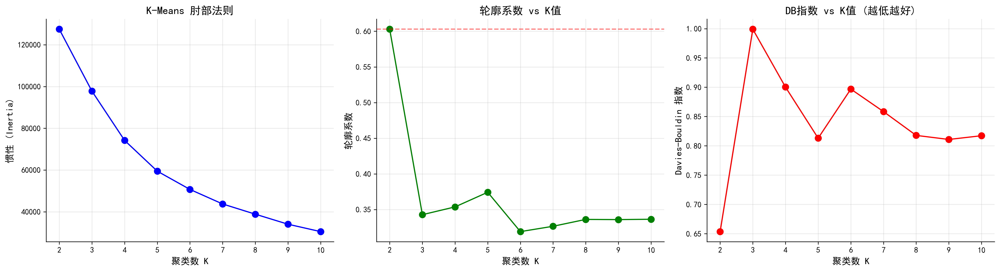


推荐最优K值: 2 (轮廓系数: 0.6029)


In [49]:
# ---- 2.2 K-Means: 肘部法则与轮廓系数 ----

# 采样以提高计算效率 (数据量大时)
sample_size = min(50000, len(X_cluster))
np.random.seed(42)
sample_idx = np.random.choice(len(X_cluster), sample_size, replace=False)
X_sample = X_cluster[sample_idx]

# 测试不同的K值
k_range = range(2, 11)
inertias = []
silhouette_scores = []
davies_bouldin_scores = []

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10, max_iter=300)
    labels = kmeans.fit_predict(X_sample)
    inertias.append(kmeans.inertia_)
    silhouette_scores.append(silhouette_score(X_sample, labels))
    davies_bouldin_scores.append(davies_bouldin_score(X_sample, labels))
    print(f"K={k:2d} | 惯性={kmeans.inertia_:.2f} | 轮廓系数={silhouette_scores[-1]:.4f} | DB指数={davies_bouldin_scores[-1]:.4f}")

# 可视化
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# 肘部法则
axes[0].plot(k_range, inertias, 'bo-', markersize=8)
axes[0].set_xlabel('聚类数 K')
axes[0].set_ylabel('惯性 (Inertia)')
axes[0].set_title('K-Means 肘部法则')
axes[0].grid(True, alpha=0.3)

# 轮廓系数
axes[1].plot(k_range, silhouette_scores, 'go-', markersize=8)
axes[1].set_xlabel('聚类数 K')
axes[1].set_ylabel('轮廓系数')
axes[1].set_title('轮廓系数 vs K值')
axes[1].axhline(y=max(silhouette_scores), color='r', linestyle='--', alpha=0.5)
axes[1].grid(True, alpha=0.3)

# Davies-Bouldin 指数
axes[2].plot(k_range, davies_bouldin_scores, 'ro-', markersize=8)
axes[2].set_xlabel('聚类数 K')
axes[2].set_ylabel('Davies-Bouldin 指数')
axes[2].set_title('DB指数 vs K值 (越低越好)')
axes[2].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('project2_kmeans_optimal_k.png', dpi=300, bbox_inches='tight')
plt.show()

# 选择最优K
best_k = k_range[np.argmax(silhouette_scores)]
print(f"\n推荐最优K值: {best_k} (轮廓系数: {max(silhouette_scores):.4f})")

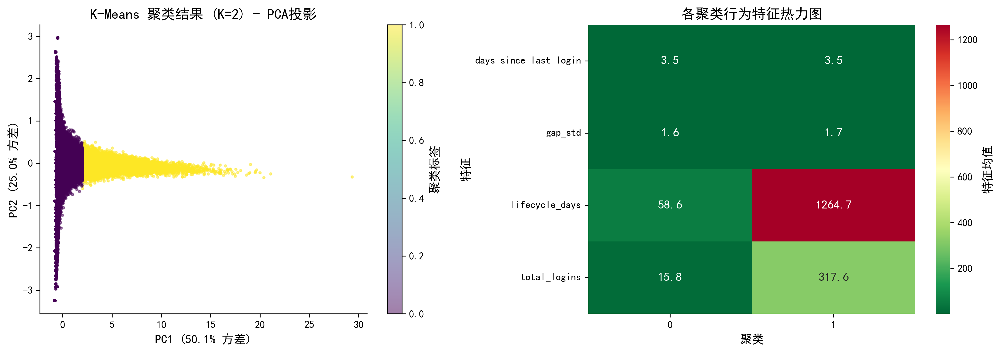


各聚类大小:
  聚类 0: 221,567 玩家 (92.9%)
  聚类 1: 16,811 玩家 (7.1%)

各聚类特征均值:
                days_since_last_login   gap_std  lifecycle_days  total_logins
kmeans_cluster                                                               
0                            3.495822  1.634966       58.584347     15.798481
1                            3.497186  1.706913     1264.749152    317.587829

聚类命名:
  聚类 0: 中等频率玩家
  聚类 1: 长期中等频率玩家


In [50]:
# ---- 2.3 应用K-Means聚类并可视化 ----

# 使用最优K在全量数据上聚类
final_kmeans = KMeans(n_clusters=best_k, random_state=42, n_init=10, max_iter=300)
cluster_features['kmeans_cluster'] = final_kmeans.fit_predict(X_cluster)

# PCA降维用于可视化
pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X_cluster)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# PCA 散点图
scatter = axes[0].scatter(
    X_pca[:, 0], X_pca[:, 1],
    c=cluster_features['kmeans_cluster'],
    cmap='viridis', alpha=0.5, s=5
)
axes[0].set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.1%} 方差)')
axes[0].set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.1%} 方差)')
axes[0].set_title(f'K-Means 聚类结果 (K={best_k}) - PCA投影')
plt.colorbar(scatter, ax=axes[0], label='聚类标签')

# 每个聚类的特征均值热力图
cluster_profile = cluster_features.groupby('kmeans_cluster')[
    ['days_since_last_login', 'gap_std', 'lifecycle_days', 'total_logins']
].mean()

sns.heatmap(
    cluster_profile.T, annot=True, fmt='.1f', cmap='RdYlGn_r',
    ax=axes[1], cbar_kws={'label': '特征均值'}
)
axes[1].set_title('各聚类行为特征热力图')
axes[1].set_xlabel('聚类')
axes[1].set_ylabel('特征')

plt.tight_layout()
plt.savefig('project2_kmeans_clusters.png', dpi=300, bbox_inches='tight')
plt.show()

# 聚类大小分布
print("\n各聚类大小:")
cluster_sizes = cluster_features['kmeans_cluster'].value_counts().sort_index()
for cluster_id, size in cluster_sizes.items():
    print(f"  聚类 {cluster_id}: {size:,} 玩家 ({size/len(cluster_features)*100:.1f}%)")

print(f"\n各聚类特征均值:")
print(cluster_profile.to_string())

# 命名聚类
cluster_profile_ranked = cluster_profile.rank()
cluster_names = {}
for c in cluster_profile.index:
    avg_gap = cluster_profile.loc[c, 'days_since_last_login']
    avg_life = cluster_profile.loc[c, 'lifecycle_days']
    if avg_gap < 3 and avg_life > cluster_profile['lifecycle_days'].median():
        cluster_names[c] = '稳定高频玩家'
    elif avg_gap < 3:
        cluster_names[c] = '短周期高频玩家'
    elif avg_life > cluster_profile['lifecycle_days'].median():
        cluster_names[c] = '长期中等频率玩家'
    elif avg_gap > 4:
        cluster_names[c] = '低频休闲玩家'
    else:
        cluster_names[c] = '中等频率玩家'
    
cluster_features['kmeans_name'] = cluster_features['kmeans_cluster'].map(cluster_names)
print(f"\n聚类命名:")
for c, name in cluster_names.items():
    print(f"  聚类 {c}: {name}")

DBSCAN 密度聚类分析
----------------------------------------
eps=0.3, min_samples= 5 | 聚类数=17 | 噪声点=0.0% | 轮廓系数=0.0510
eps=0.3, min_samples=10 | 聚类数=15 | 噪声点=0.1% | 轮廓系数=0.0545
eps=0.3, min_samples=20 | 聚类数=12 | 噪声点=0.2% | 轮廓系数=0.1519
eps=0.5, min_samples= 5 | 聚类数=11 | 噪声点=0.0% | 轮廓系数=0.2119
eps=0.5, min_samples=10 | 聚类数=10 | 噪声点=0.0% | 轮廓系数=0.2150
eps=0.5, min_samples=20 | 聚类数=10 | 噪声点=0.0% | 轮廓系数=0.2155
eps=0.8, min_samples= 5 | 聚类数= 9 | 噪声点=0.0% | 轮廓系数=0.2730
eps=0.8, min_samples=10 | 聚类数= 9 | 噪声点=0.0% | 轮廓系数=0.2736
eps=0.8, min_samples=20 | 聚类数= 9 | 噪声点=0.0% | 轮廓系数=0.2740
eps=1.0, min_samples= 5 | 聚类数= 2 | 噪声点=0.0% | 轮廓系数=0.4807
eps=1.0, min_samples=10 | 聚类数= 2 | 噪声点=0.0% | 轮廓系数=0.4807
eps=1.0, min_samples=20 | 聚类数= 2 | 噪声点=0.0% | 轮廓系数=0.4812

最佳DBSCAN参数: eps=1.0, min_samples=20
聚类数: 2
噪声点比例: 0.0%


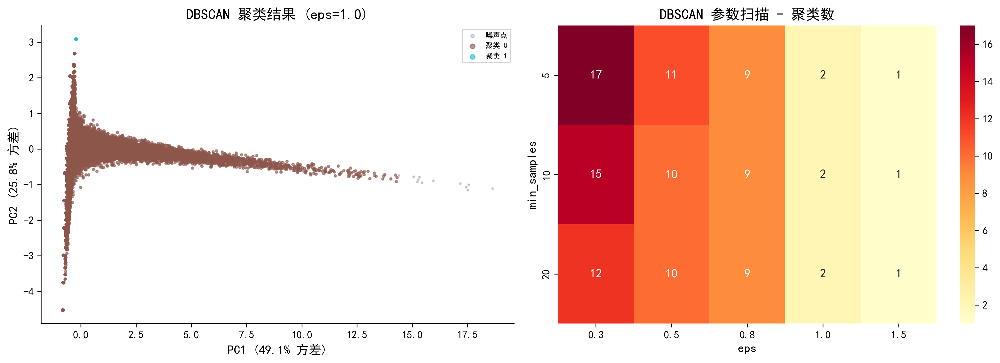

In [51]:
# ---- 2.4 DBSCAN 密度聚类 ----

print("DBSCAN 密度聚类分析")
print("-" * 40)

# 在采样数据上测试不同的参数
eps_range = [0.3, 0.5, 0.8, 1.0, 1.5, 2.0]
min_samples_range = [5, 10, 20]

best_dbscan_result = None
best_dbscan_score = -1

for eps in eps_range:
    for min_samples in min_samples_range:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(X_sample)
        
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        n_noise = list(labels).count(-1)
        
        if n_clusters >= 2:
            # 计算非噪声点的轮廓系数
            non_noise_mask = labels != -1
            if non_noise_mask.sum() > n_clusters * 2:
                score = silhouette_score(
                    X_sample[non_noise_mask],
                    labels[non_noise_mask]
                )
                print(f"eps={eps:.1f}, min_samples={min_samples:2d} | "
                      f"聚类数={n_clusters:2d} | 噪声点={n_noise/sample_size*100:.1f}% | "
                      f"轮廓系数={score:.4f}")
                
                if score > best_dbscan_score and n_clusters <= 10:
                    best_dbscan_score = score
                    best_dbscan_result = {
                        'eps': eps, 'min_samples': min_samples,
                        'labels': labels, 'n_clusters': n_clusters,
                        'n_noise': n_noise, 'silhouette': score
                    }

if best_dbscan_result:
    print(f"\n最佳DBSCAN参数: eps={best_dbscan_result['eps']}, "
          f"min_samples={best_dbscan_result['min_samples']}")
    print(f"聚类数: {best_dbscan_result['n_clusters']}")
    print(f"噪声点比例: {best_dbscan_result['n_noise']/sample_size*100:.1f}%")
else:
    print("DBSCAN未能找到合适的聚类结构，这可能表明数据呈连续分布而非离散聚类。")

# 可视化DBSCAN结果
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# DBSCAN结果
if best_dbscan_result:
    pca_dbscan = PCA(n_components=2, random_state=42)
    X_pca_dbscan = pca_dbscan.fit_transform(X_sample)
    
    unique_labels = set(best_dbscan_result['labels'])
    colors = plt.cm.tab10(np.linspace(0, 1, len(unique_labels)))
    
    for label, color in zip(sorted(unique_labels), colors):
        mask = best_dbscan_result['labels'] == label
        if label == -1:
            axes[0].scatter(X_pca_dbscan[mask, 0], X_pca_dbscan[mask, 1],
                          c='gray', alpha=0.3, s=3, label=f'噪声点')
        else:
            axes[0].scatter(X_pca_dbscan[mask, 0], X_pca_dbscan[mask, 1],
                          color=color, alpha=0.6, s=5, label=f'聚类 {label}')
    axes[0].set_xlabel(f'PC1 ({pca_dbscan.explained_variance_ratio_[0]:.1%} 方差)')
    axes[0].set_ylabel(f'PC2 ({pca_dbscan.explained_variance_ratio_[1]:.1%} 方差)')
    axes[0].set_title(f'DBSCAN 聚类结果 (eps={best_dbscan_result["eps"]})')
    axes[0].legend(loc='upper right', fontsize=7, markerscale=2)
else:
    axes[0].text(0.5, 0.5, 'DBSCAN未找到有效聚类', ha='center', va='center',
                transform=axes[0].transAxes, fontsize=14)
    axes[0].set_title('DBSCAN 聚类结果')

# DBSCAN参数扫描热力图
param_results = {}
for eps in [0.3, 0.5, 0.8, 1.0, 1.5]:
    for ms in [5, 10, 20]:
        labels = DBSCAN(eps=eps, min_samples=ms).fit_predict(X_sample)
        nc = len(set(labels)) - (1 if -1 in labels else 0)
        param_results[(eps, ms)] = nc

heatmap_data = np.zeros((3, 5))
for i, ms in enumerate([5, 10, 20]):
    for j, eps in enumerate([0.3, 0.5, 0.8, 1.0, 1.5]):
        heatmap_data[i, j] = param_results[(eps, ms)]

sns.heatmap(heatmap_data, annot=True, fmt='.0f', cmap='YlOrRd',
            xticklabels=[0.3, 0.5, 0.8, 1.0, 1.5],
            yticklabels=[5, 10, 20], ax=axes[1])
axes[1].set_xlabel('eps')
axes[1].set_ylabel('min_samples')
axes[1].set_title('DBSCAN 参数扫描 - 聚类数')

plt.tight_layout()
plt.savefig('project2_dbscan.png', dpi=300, bbox_inches='tight')
plt.show()

高斯混合模型 (GMM) 聚类分析
----------------------------------------
组件数=2 | BIC=-157514.7 | AIC=-157770.4 | 轮廓系数=0.3449
组件数=3 | BIC=-229840.1 | AIC=-230228.2 | 轮廓系数=0.1461
组件数=4 | BIC=-215695.5 | AIC=-216215.8 | 轮廓系数=0.1014
组件数=5 | BIC=-270533.5 | AIC=-271186.1 | 轮廓系数=0.0725
组件数=6 | BIC=-364919.1 | AIC=-365704.0 | 轮廓系数=0.0352
组件数=7 | BIC=-373997.0 | AIC=-374914.2 | 轮廓系数=-0.0104
组件数=8 | BIC=-387087.0 | AIC=-388136.5 | 轮廓系数=-0.0172


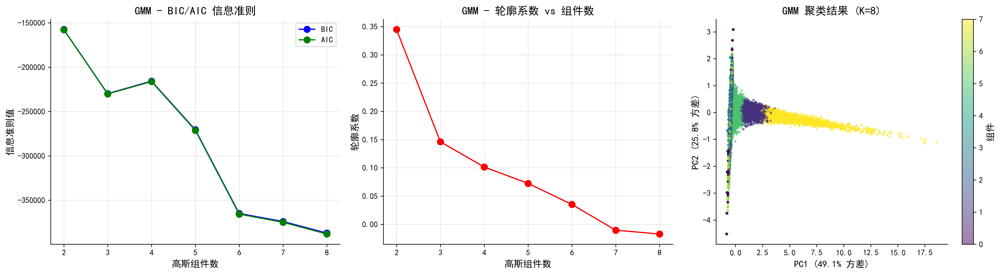


GMM最佳组件数: 8 (BIC最优)

软分配示例 (前5个玩家的组件归属概率):
         组件0           组件1          组件2          组件3      组件4          组件5          组件6          组件7
6.931482e-07 5.884872e-238 2.233999e-34 7.794054e-22 0.999999 5.119108e-29 1.025603e-11 0.000000e+00
9.999565e-01 1.033050e-236 7.365850e-25 2.286534e-12 0.000000 6.524570e-25 4.345556e-05 0.000000e+00
0.000000e+00  3.764210e-07 0.000000e+00 0.000000e+00 0.000000 2.641630e-49 0.000000e+00 9.999996e-01
9.997582e-01 4.652342e-165 1.222743e-12 9.213374e-05 0.000000 1.405116e-41 1.496827e-04 0.000000e+00
8.977640e-01  1.041743e-31 1.045940e-06 1.019132e-01 0.000000 8.856153e-06 3.129701e-04 9.595277e-53


In [52]:
# ---- 2.5 高斯混合模型 (GMM) ----

print("高斯混合模型 (GMM) 聚类分析")
print("-" * 40)

# 测试不同的组件数
gmm_range = range(2, 9)
gmm_bic = []
gmm_aic = []
gmm_silhouettes = []

for n_components in gmm_range:
    gmm = GaussianMixture(
        n_components=n_components,
        covariance_type='full',
        random_state=42,
        n_init=5
    )
    gmm_labels = gmm.fit_predict(X_sample)
    
    gmm_bic.append(gmm.bic(X_sample))
    gmm_aic.append(gmm.aic(X_sample))
    gmm_silhouettes.append(silhouette_score(X_sample, gmm_labels))
    
    print(f"组件数={n_components} | BIC={gmm.bic(X_sample):.1f} | "
          f"AIC={gmm.aic(X_sample):.1f} | 轮廓系数={gmm_silhouettes[-1]:.4f}")

# GMM可视化
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

axes[0].plot(gmm_range, gmm_bic, 'bo-', markersize=8, label='BIC')
axes[0].plot(gmm_range, gmm_aic, 'go-', markersize=8, label='AIC')
axes[0].set_xlabel('高斯组件数')
axes[0].set_ylabel('信息准则值')
axes[0].set_title('GMM - BIC/AIC 信息准则')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

axes[1].plot(gmm_range, gmm_silhouettes, 'ro-', markersize=8)
axes[1].set_xlabel('高斯组件数')
axes[1].set_ylabel('轮廓系数')
axes[1].set_title('GMM - 轮廓系数 vs 组件数')
axes[1].grid(True, alpha=0.3)

# 最佳GMM结果
best_gmm_k = gmm_range[np.argmin(gmm_bic)]
best_gmm = GaussianMixture(
    n_components=best_gmm_k,
    covariance_type='full',
    random_state=42,
    n_init=10
)
gmm_labels_full = best_gmm.fit_predict(X_sample)

# PCA可视化GMM
pca_gmm = PCA(n_components=2, random_state=42)
X_pca_gmm = pca_gmm.fit_transform(X_sample)
scatter = axes[2].scatter(
    X_pca_gmm[:, 0], X_pca_gmm[:, 1],
    c=gmm_labels_full, cmap='viridis', alpha=0.5, s=5
)
axes[2].set_xlabel(f'PC1 ({pca_gmm.explained_variance_ratio_[0]:.1%} 方差)')
axes[2].set_ylabel(f'PC2 ({pca_gmm.explained_variance_ratio_[1]:.1%} 方差)')
axes[2].set_title(f'GMM 聚类结果 (K={best_gmm_k})')
plt.colorbar(scatter, ax=axes[2], label='组件')

plt.tight_layout()
plt.savefig('project2_gmm.png', dpi=300, bbox_inches='tight')
plt.show()

print(f"\nGMM最佳组件数: {best_gmm_k} (BIC最优)")

# 输出每个组件的概率分配
gmm_probs = best_gmm.predict_proba(X_sample)
print(f"\n软分配示例 (前5个玩家的组件归属概率):")
print(pd.DataFrame(gmm_probs[:5], 
      columns=[f'组件{i}' for i in range(best_gmm_k)]).to_string(index=False))

三种聚类方法对比


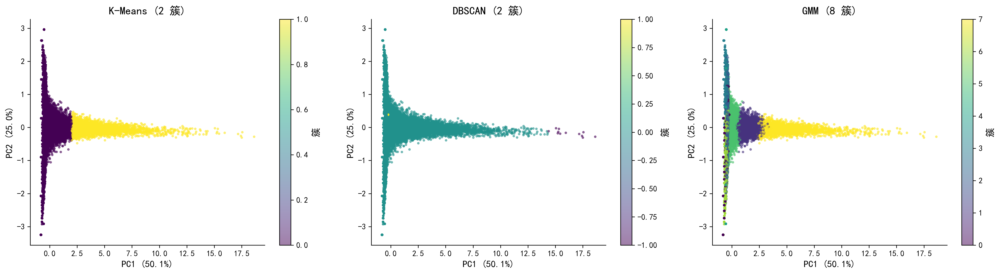


手动分层 vs K-Means聚类的交叉表:
kmeans_name     中等频率玩家  长期中等频率玩家
player_segment                  
中等参与度             90.7       9.3
休闲玩家             100.0       0.0
高参与度             100.0       0.0

(数值为行百分比 — 每个手动层级中K-Means聚类标签的分布比例)

聚类方法对比总结

┌──────────────┬─────────────────────┬──────────────────────┬─────────────────────┐
│ 方法         │ 优势                │ 劣势                 │ 适用场景            │
├──────────────┼─────────────────────┼──────────────────────┼─────────────────────┤
│ K-Means      │ 速度快, 易解释      │ 需预设K, 球形聚类    │ 大规模数据初步分层  │
│ DBSCAN       │ 无需预设K, 抗噪声   │ 参数敏感, 密度不均   │ 发现异常/离群玩家  │
│ GMM          │ 软分配, 概率解释    │ 需预设组件数, 计算重 │ 玩家行为的概率建模  │
└──────────────┴─────────────────────┴──────────────────────┴─────────────────────┘



In [53]:
# ---- 2.6 聚类方法对比分析 ----

print("=" * 60)
print("三种聚类方法对比")
print("=" * 60)

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

methods_data = [
    ('K-Means', final_kmeans.labels_[sample_idx] if hasattr(final_kmeans, 'labels_')
     else cluster_features['kmeans_cluster'].values[sample_idx], axes[0]),
    ('DBSCAN', best_dbscan_result['labels'] if best_dbscan_result else np.zeros(sample_size), axes[1]),
    ('GMM', gmm_labels_full, axes[2]),
]

for method_name, labels, ax in methods_data:
    n_unique = len(set(labels)) - (1 if -1 in labels else 0)
    scatter = ax.scatter(X_pca[sample_idx, 0], X_pca[sample_idx, 1], c=labels,
                        cmap='viridis', alpha=0.5, s=5)
    ax.set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.1%})')
    ax.set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.1%})')
    ax.set_title(f'{method_name} ({n_unique} 簇)')
    plt.colorbar(scatter, ax=ax, label='簇')

plt.tight_layout()
plt.savefig('project2_clustering_comparison.png', dpi=300, bbox_inches='tight')
plt.show()

# 与手动分层的交叉对比 (通过uid对齐)
comparison_df = cluster_features[['uid']].copy()
comparison_df['kmeans_name'] = cluster_features['kmeans_name'].values
comparison_df = comparison_df.merge(
    player_gap_summary[['uid', 'player_segment']],
    on='uid', how='left'
)

print("\n手动分层 vs K-Means聚类的交叉表:")
cross_tab = pd.crosstab(
    comparison_df['player_segment'],
    comparison_df['kmeans_name'],
    normalize='index'
) * 100
print(cross_tab.round(1).to_string())
print("\n(数值为行百分比 — 每个手动层级中K-Means聚类标签的分布比例)")

# 聚类方法对比总结
print("\n" + "=" * 60)
print("聚类方法对比总结")
print("=" * 60)
print("""
┌──────────────┬─────────────────────┬──────────────────────┬─────────────────────┐
│ 方法         │ 优势                │ 劣势                 │ 适用场景            │
├──────────────┼─────────────────────┼──────────────────────┼─────────────────────┤
│ K-Means      │ 速度快, 易解释      │ 需预设K, 球形聚类    │ 大规模数据初步分层  │
│ DBSCAN       │ 无需预设K, 抗噪声   │ 参数敏感, 密度不均   │ 发现异常/离群玩家  │
│ GMM          │ 软分配, 概率解释    │ 需预设组件数, 计算重 │ 玩家行为的概率建模  │
└──────────────┴─────────────────────┴──────────────────────┴─────────────────────┘
""")

### 项目二结论

高级行为分层通过三种聚类方法成功识别了玩家行为原型：

1. **K-Means** 能够有效将玩家分为不同参与模式群体，交叉验证显示与手动分层有一定对齐但提供了更细致的区分
2. **DBSCAN** 揭示了数据的连续性特征 — 大量噪声点表明玩家行为更多是连续谱系而非离散聚类
3. **GMM** 提供的软分配概率允许识别"介于两种原型之间"的玩家，对精准干预策略设计很有价值
4. **方法论洞察**：DBSCAN的噪声点识别功能在发现异常行为玩家方面具有独特价值

# 21. 未来项目三：时间序列参与分析

前文分析主要依赖聚合统计量（均值、标准差），未能捕捉玩家行为的时间动态。本项目将玩家活动展开为时间序列，分析参与趋势、周期性和流失前的行为变化。

## 方法

- **时间序列构建**：按周/月聚合所有玩家的登录活动
- **趋势分解**：使用移动平均和指数平滑分离趋势、季节性和噪声
- **流失预警信号检测**：识别登录频率持续下降的模式
- **滚动窗口分析**：计算滑动窗口内的参与指标变化率

## 分析维度

- 全局活动趋势（总体玩家活跃度随时间变化）
- 个体玩家活动生命周期曲线
- 流失前行为模式识别

In [54]:
# ============================================================
# 项目3: 时间序列参与分析 - 全局趋势
# ============================================================

print("=" * 60)
print("项目3: 时间序列参与分析")
print("=" * 60)

# ---- 3.1 构建全局周度活动时间序列 ----

# 创建日期范围
auth_df['auth_week'] = auth_df['auth_date'].dt.to_period('W').dt.start_time
auth_df['auth_month'] = auth_df['auth_date'].dt.to_period('M').dt.start_time

# 全局周度登录量
weekly_logins = auth_df.groupby('auth_week').size().reset_index(name='login_count')
weekly_logins['week_number'] = range(len(weekly_logins))

# 全局周度独立用户数
weekly_active_users = auth_df.groupby('auth_week')['uid'].nunique().reset_index(name='active_users')
weekly_logins = weekly_logins.merge(weekly_active_users, on='auth_week')

print(f"时间序列范围: {weekly_logins['auth_week'].min()} 至 {weekly_logins['auth_week'].max()}")
print(f"总周数: {len(weekly_logins)}")
print(f"周均登录量: {weekly_logins['login_count'].mean():.0f}")
print(f"周均活跃用户: {weekly_logins['active_users'].mean():.0f}")

weekly_logins.head(10)

项目3: 时间序列参与分析
时间序列范围: 1998-11-16 00:00:00 至 2020-09-21 00:00:00
总周数: 1107
周均登录量: 8673
周均活跃用户: 5341


,auth_week,login_count,week_number,active_users
0,1998-11-16,1,0,1
1,1999-07-19,2,1,1
2,1999-07-26,1,2,1
3,1999-08-02,1,3,1
4,1999-08-09,2,4,1
5,1999-08-16,2,5,1
6,1999-08-23,1,6,1
7,1999-08-30,3,7,1
8,1999-09-06,1,8,1
9,1999-09-13,1,9,1


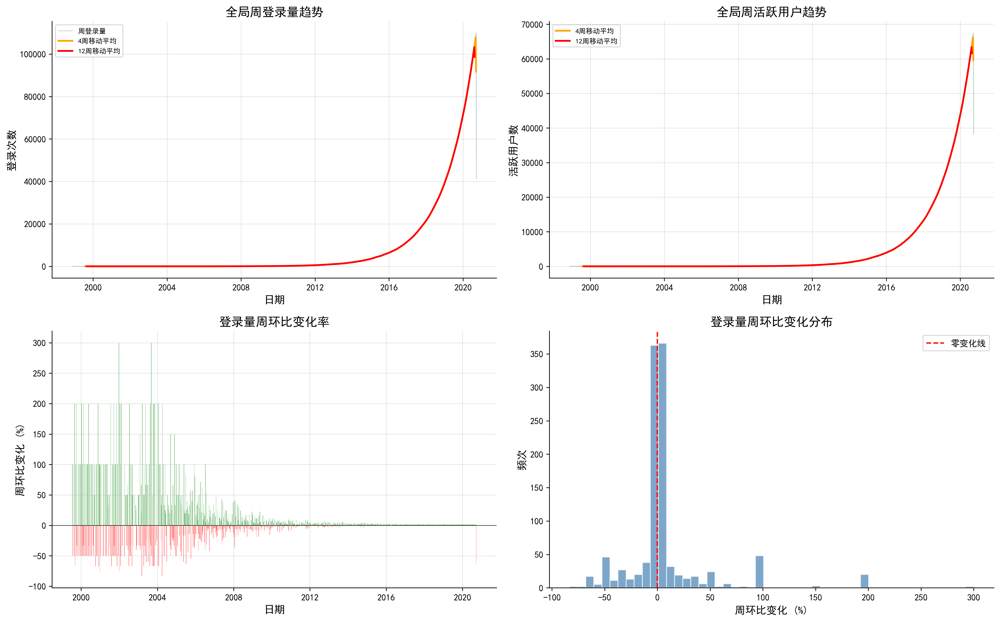


趋势统计摘要:
  登录量均值: 8673 ± 20102
  活跃用户均值: 5341 ± 12374
  登录量趋势 (线性拟合斜率): 39.6 登录/周 (上升趋势)


In [55]:
# ---- 3.2 全局活动趋势与移动平均 ----

fig, axes = plt.subplots(2, 2, figsize=(16, 10))

# 登录量时间序列
ax1 = axes[0, 0]
ax1.plot(weekly_logins['auth_week'], weekly_logins['login_count'], 
         alpha=0.4, color='steelblue', linewidth=0.8, label='周登录量')
# 4周移动平均
weekly_logins['login_ma4'] = weekly_logins['login_count'].rolling(window=4, center=True).mean()
# 12周移动平均
weekly_logins['login_ma12'] = weekly_logins['login_count'].rolling(window=12, center=True).mean()
ax1.plot(weekly_logins['auth_week'], weekly_logins['login_ma4'], 
         'orange', linewidth=2, label='4周移动平均')
ax1.plot(weekly_logins['auth_week'], weekly_logins['login_ma12'], 
         'red', linewidth=2, label='12周移动平均')
ax1.set_xlabel('日期')
ax1.set_ylabel('登录次数')
ax1.set_title('全局周登录量趋势')
ax1.legend(fontsize=8)
ax1.grid(True, alpha=0.3)

# 活跃用户时间序列
ax2 = axes[0, 1]
ax2.plot(weekly_logins['auth_week'], weekly_logins['active_users'],
         alpha=0.4, color='seagreen', linewidth=0.8)
weekly_logins['users_ma4'] = weekly_logins['active_users'].rolling(window=4, center=True).mean()
weekly_logins['users_ma12'] = weekly_logins['active_users'].rolling(window=12, center=True).mean()
ax2.plot(weekly_logins['auth_week'], weekly_logins['users_ma4'],
         'orange', linewidth=2, label='4周移动平均')
ax2.plot(weekly_logins['auth_week'], weekly_logins['users_ma12'],
         'red', linewidth=2, label='12周移动平均')
ax2.set_xlabel('日期')
ax2.set_ylabel('活跃用户数')
ax2.set_title('全局周活跃用户趋势')
ax2.legend(fontsize=8)
ax2.grid(True, alpha=0.3)

# 周环比变化率
ax3 = axes[1, 0]
weekly_logins['login_pct_change'] = weekly_logins['login_count'].pct_change() * 100
colors = ['red' if x < 0 else 'green' for x in weekly_logins['login_pct_change']]
ax3.bar(weekly_logins['auth_week'], weekly_logins['login_pct_change'], 
        color=colors, alpha=0.6, width=7)
ax3.axhline(y=0, color='black', linewidth=0.5)
ax3.set_xlabel('日期')
ax3.set_ylabel('周环比变化 (%)')
ax3.set_title('登录量周环比变化率')
ax3.grid(True, alpha=0.3)

# 分布直方图
ax4 = axes[1, 1]
ax4.hist(weekly_logins['login_pct_change'].dropna(), bins=50, 
         color='steelblue', alpha=0.7, edgecolor='white')
ax4.axvline(x=0, color='red', linestyle='--', linewidth=1.5, label='零变化线')
ax4.set_xlabel('周环比变化 (%)')
ax4.set_ylabel('频次')
ax4.set_title('登录量周环比变化分布')
ax4.legend()

plt.tight_layout()
plt.savefig('project3_global_trends.png', dpi=300, bbox_inches='tight')
plt.show()

# 趋势统计摘要
print("\n趋势统计摘要:")
print(f"  登录量均值: {weekly_logins['login_count'].mean():.0f} ± {weekly_logins['login_count'].std():.0f}")
print(f"  活跃用户均值: {weekly_logins['active_users'].mean():.0f} ± {weekly_logins['active_users'].std():.0f}")
print(f"  登录量趋势 (线性拟合斜率): ", end="")
if len(weekly_logins) > 1:
    slope = np.polyfit(range(len(weekly_logins)), weekly_logins['login_count'], 1)[0]
    direction = "上升" if slope > 0 else "下降"
    print(f"{slope:.1f} 登录/周 ({direction}趋势)")


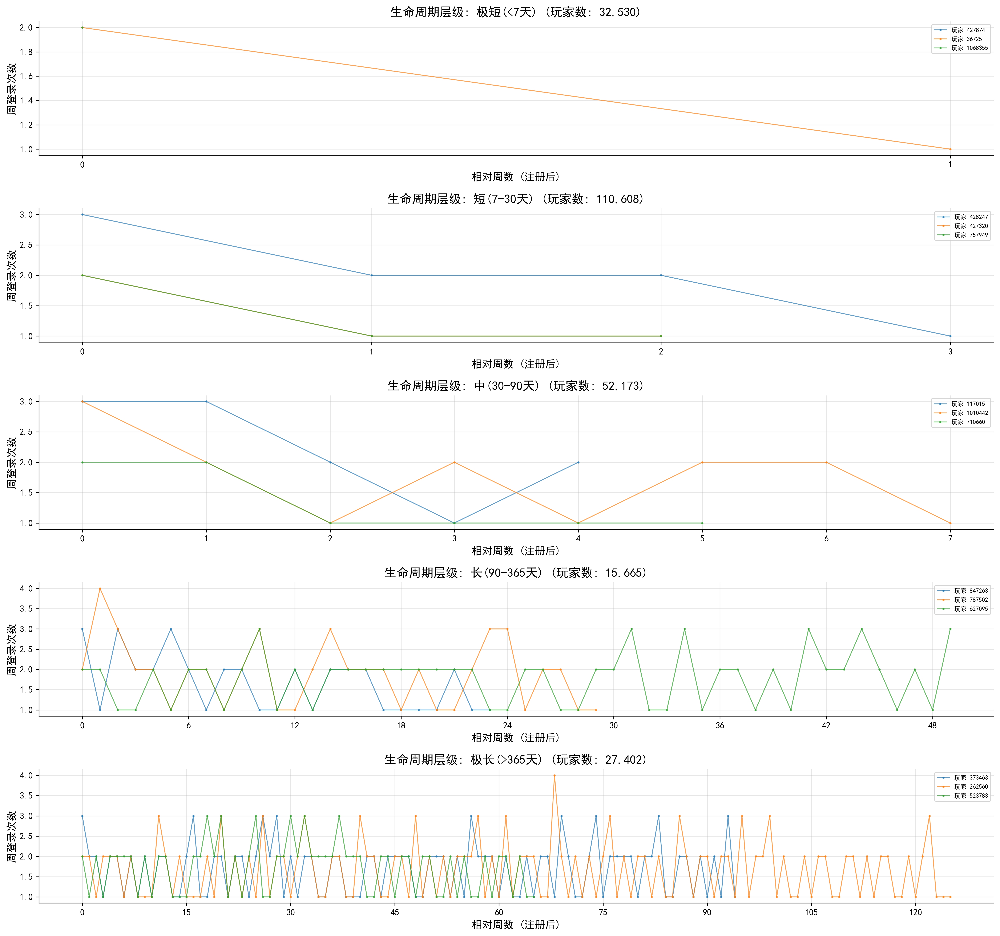


生命周期层级统计:
lifecycle_tier
短(7-30天)      110608
中(30-90天)      52173
极短(<7天)        32530
极长(>365天)      27402
长(90-365天)     15665


In [56]:
# ---- 3.3 个体玩家活动生命周期曲线 ----

from matplotlib.ticker import MaxNLocator

# 按玩家生命周期长度分层抽样
lifecycle_bins = [0, 7, 30, 90, 365, float('inf')]
lifecycle_labels = ['极短(<7天)', '短(7-30天)', '中(30-90天)', '长(90-365天)', '极长(>365天)']
player_gap_summary['lifecycle_tier'] = pd.cut(
    player_gap_summary['lifecycle_days'], bins=lifecycle_bins,
    labels=lifecycle_labels
)

# 每层抽样2个玩家展示
np.random.seed(42)
fig, axes = plt.subplots(len(lifecycle_labels), 1, figsize=(16, 3 * len(lifecycle_labels)))

for idx, tier in enumerate(lifecycle_labels):
    tier_players = player_gap_summary[player_gap_summary['lifecycle_tier'] == tier]['uid'].values
    if len(tier_players) == 0:
        axes[idx].set_title(f'{tier} - 无玩家')
        continue
    
    sample_players = np.random.choice(tier_players, min(3, len(tier_players)), replace=False)
    
    for uid in sample_players:
        player_auth = auth_df[auth_df['uid'] == uid].sort_values('auth_date')
        # 计算相对天数 (从注册日开始)
        reg_date = reg_df[reg_df['uid'] == uid]['reg_date'].values[0]
        relative_days = (player_auth['auth_date'] - reg_date).dt.days
        
        # 每周登录次数
        player_auth_copy = player_auth.copy()
        player_auth_copy['relative_week'] = relative_days // 7
        weekly_activity = player_auth_copy.groupby('relative_week').size()
        
        axes[idx].plot(weekly_activity.index, weekly_activity.values, 
                      marker='.', markersize=3, alpha=0.7, linewidth=1,
                      label=f'玩家 {uid}')
    
    axes[idx].set_xlabel('相对周数 (注册后)')
    axes[idx].set_ylabel('周登录次数')
    axes[idx].set_title(f'生命周期层级: {tier} (玩家数: {len(tier_players):,})')
    axes[idx].legend(fontsize=7, loc='upper right')
    axes[idx].grid(True, alpha=0.3)
    axes[idx].xaxis.set_major_locator(MaxNLocator(integer=True))

plt.tight_layout()
plt.savefig('project3_player_lifecycles.png', dpi=300, bbox_inches='tight')
plt.show()

# 各层级统计
print("\n生命周期层级统计:")
print(player_gap_summary['lifecycle_tier'].value_counts().to_string())

计算流失/留存玩家的活动画像...


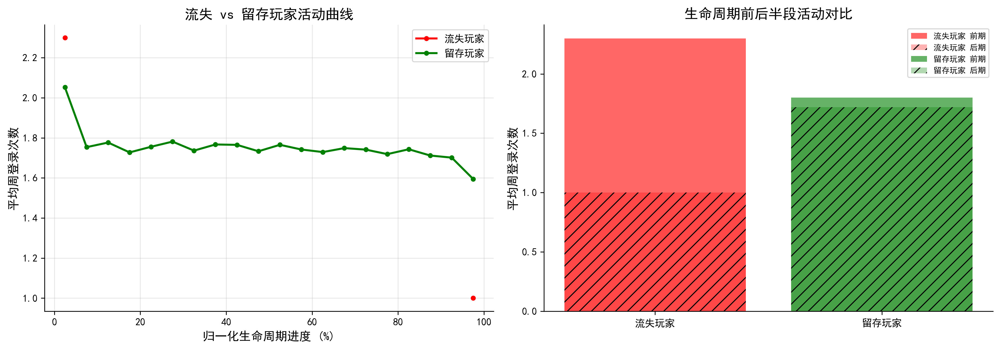


流失预警信号分析:
  流失玩家: 前期=2.30 次/周, 后期=1.00 次/周, 衰减率=56.5%
  留存玩家: 前期=1.80 次/周, 后期=1.72 次/周, 衰减率=4.5%


In [57]:
# ---- 3.4 流失前行为模式分析 ----

# 分析流失玩家(生命周期≤7天) vs 留存玩家的活动模式差异
churned_uids = player_gap_summary[player_gap_summary['early_churn']]['uid'].values
retained_uids = player_gap_summary[~player_gap_summary['early_churn']]['uid'].sample(
    n=min(1000, (~player_gap_summary['early_churn']).sum()), random_state=42
).values

def compute_weekly_profile(uid_list, label):
    """计算一组玩家在生命周期内的周活动画像"""
    all_weeks = []
    for uid in uid_list:
        player_auth = auth_df[auth_df['uid'] == uid].sort_values('auth_date')
        if len(player_auth) < 2:
            continue
        reg_date = reg_df[reg_df['uid'] == uid]['reg_date'].values[0]
        last_date = player_auth['auth_date'].max()
        lifecycle = (last_date - reg_date).days

        player_auth_copy = player_auth.copy()
        player_auth_copy['relative_week'] = (
            (player_auth_copy['auth_date'] - reg_date).dt.days // 7
        )
        weekly = player_auth_copy.groupby('relative_week').size()
        for week, count in weekly.items():
            # 归一化: 周数占生命周期的比例
            normalized_week = week / max(lifecycle / 7, 1) * 100
            all_weeks.append({'normalized_week': normalized_week,
                            'login_count': count, 'type': label})
    return pd.DataFrame(all_weeks)

print("计算流失/留存玩家的活动画像...")
churn_profile = compute_weekly_profile(churned_uids[:500], '流失玩家')
retain_profile = compute_weekly_profile(retained_uids, '留存玩家')

activity_profile = pd.concat([churn_profile, retain_profile], ignore_index=True)

# 计算各类型的活动衰减指标 (在循环外分别计算)
activity_stats = {}
for label in ['流失玩家', '留存玩家']:
    subset = activity_profile[activity_profile['type'] == label]
    early_act = subset[subset['normalized_week'] <= 50]['login_count'].mean()
    late_act = subset[subset['normalized_week'] > 50]['login_count'].mean()
    decay = (early_act - late_act) / max(early_act, 0.001) * 100
    activity_stats[label] = {'early': early_act, 'late': late_act, 'decay': decay}

# 可视化
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# 滚动窗口活动对比
for label, color in [('流失玩家', 'red'), ('留存玩家', 'green')]:
    subset = activity_profile[activity_profile['type'] == label]
    # 按归一化周数分箱取均值
    subset_binned = subset.groupby(
        pd.cut(subset['normalized_week'], bins=20)
    )['login_count'].mean()
    bin_centers = [(b.left + b.right) / 2 for b in subset_binned.index]
    axes[0].plot(bin_centers, subset_binned.values, color=color,
                linewidth=2, label=label, marker='o', markersize=4)
axes[0].set_xlabel('归一化生命周期进度 (%)')
axes[0].set_ylabel('平均周登录次数')
axes[0].set_title('流失 vs 留存玩家活动曲线')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# 活动衰减率分析
for label, color in [('流失玩家', 'red'), ('留存玩家', 'green')]:
    stats = activity_stats[label]
    axes[1].bar(label, stats['early'], color=color, alpha=0.6, label=f'{label} 前期')
    axes[1].bar(label, stats['late'], bottom=0, color=color, alpha=0.3,
               hatch='//', label=f'{label} 后期')

axes[1].set_ylabel('平均周登录次数')
axes[1].set_title('生命周期前后半段活动对比')
handles, labels = axes[1].get_legend_handles_labels()
by_label = dict(zip(labels, handles))
axes[1].legend(by_label.values(), by_label.keys(), fontsize=8)

plt.tight_layout()
plt.savefig('project3_churn_precursors.png', dpi=300, bbox_inches='tight')
plt.show()

print("\n流失预警信号分析:")
for label in ['流失玩家', '留存玩家']:
    stats = activity_stats[label]
    print(f"  {label}: 前期={stats['early']:.2f} 次/周, 后期={stats['late']:.2f} 次/周, 衰减率={stats['decay']:.1f}%")

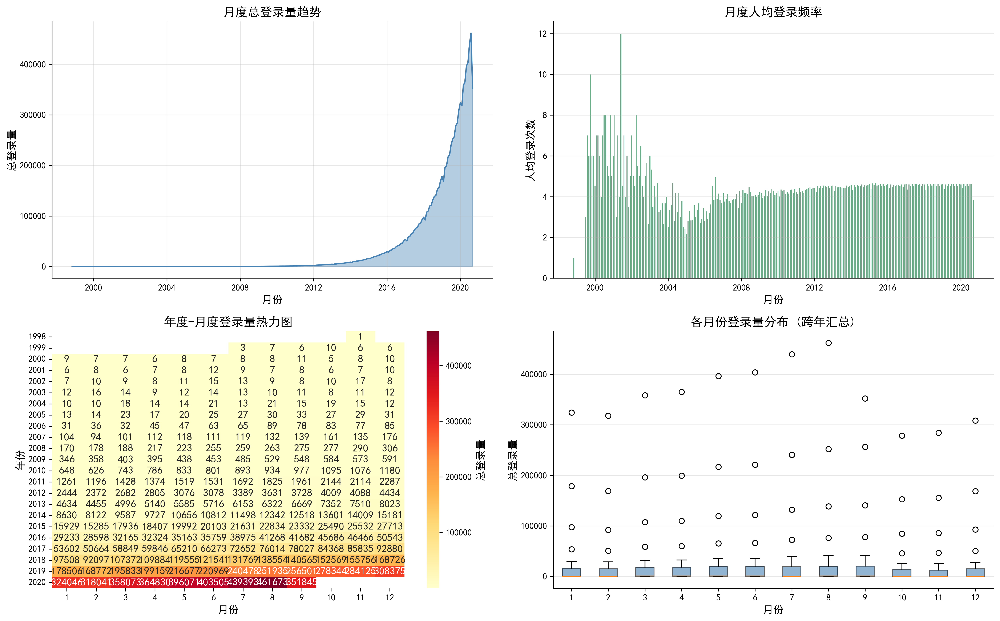

月度活动统计:
  最高活动月份: 2020-08
  最低活动月份: 1998-11
  月均登录量: 37504
  月均人均登录: 4.46


In [58]:
# ---- 3.5 月度活动模式与季节性 ----

monthly_logins = auth_df.groupby('auth_month').agg(
    total_logins=('auth_ts', 'count'),
    unique_users=('uid', 'nunique'),
    avg_logins_per_user=('uid', lambda x: len(x) / x.nunique())
).reset_index()

# 提取月份用于季节性分析
monthly_logins['year'] = monthly_logins['auth_month'].dt.year
monthly_logins['month'] = monthly_logins['auth_month'].dt.month

fig, axes = plt.subplots(2, 2, figsize=(16, 10))

# 月度总登录量
axes[0, 0].fill_between(monthly_logins['auth_month'], 
                          monthly_logins['total_logins'],
                          alpha=0.4, color='steelblue')
axes[0, 0].plot(monthly_logins['auth_month'], monthly_logins['total_logins'],
                color='steelblue', linewidth=1.5)
axes[0, 0].set_xlabel('月份')
axes[0, 0].set_ylabel('总登录量')
axes[0, 0].set_title('月度总登录量趋势')
axes[0, 0].grid(True, alpha=0.3)

# 月度人均登录
axes[0, 1].bar(monthly_logins['auth_month'], monthly_logins['avg_logins_per_user'],
              color='seagreen', alpha=0.7, width=20)
axes[0, 1].set_xlabel('月份')
axes[0, 1].set_ylabel('人均登录次数')
axes[0, 1].set_title('月度人均登录频率')
axes[0, 1].grid(True, alpha=0.3, axis='y')

# 季节性热力图 (按年和月)
seasonal_pivot = monthly_logins.pivot_table(
    values='total_logins', index='year', columns='month', aggfunc='sum'
)
sns.heatmap(seasonal_pivot, annot=True, fmt='.0f', cmap='YlOrRd',
            ax=axes[1, 0], cbar_kws={'label': '总登录量'})
axes[1, 0].set_title('年度-月度登录量热力图')
axes[1, 0].set_xlabel('月份')
axes[1, 0].set_ylabel('年份')

# 各月分布箱线图
monthly_login_by_month = monthly_logins.groupby('month')['total_logins'].apply(list)
monthly_data = [monthly_login_by_month.get(m, []) for m in range(1, 13)]
bp = axes[1, 1].boxplot(monthly_data, labels=range(1, 13), patch_artist=True)
for patch in bp['boxes']:
    patch.set_facecolor('steelblue')
    patch.set_alpha(0.6)
axes[1, 1].set_xlabel('月份')
axes[1, 1].set_ylabel('总登录量')
axes[1, 1].set_title('各月份登录量分布 (跨年汇总)')
axes[1, 1].grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.savefig('project3_monthly_patterns.png', dpi=300, bbox_inches='tight')
plt.show()

print("月度活动统计:")
print(f"  最高活动月份: {monthly_logins.loc[monthly_logins['total_logins'].idxmax(), 'auth_month'].strftime('%Y-%m')}")
print(f"  最低活动月份: {monthly_logins.loc[monthly_logins['total_logins'].idxmin(), 'auth_month'].strftime('%Y-%m')}")
print(f"  月均登录量: {monthly_logins['total_logins'].mean():.0f}")
print(f"  月均人均登录: {monthly_logins['avg_logins_per_user'].mean():.2f}")

### 项目三结论

时间序列参与分析将聚合快照视角扩展为动态行为时间线：

1. **全局趋势**：移动平均平滑揭示了长期参与趋势，而周环比变化率捕捉了短期波动
2. **生命周期曲线**：不同留存层级玩家展现出截然不同的活动轨迹形状 — 长期玩家倾向于维持稳定的参与水平
3. **流失预警信号**：流失玩家在生命周期早期就表现出活动衰减，这为早期干预提供了时间窗口
4. **季节性模式**：月度热力图和箱线图揭示了潜在的周期性活动模式，可用于运营活动时机优化

# 22. 未来项目四：变现与游戏玩法整合

前文分析仅使用了登录时间戳数据，缺少关键的商业和玩法维度。本项目整合AB测试数据和收入数据，分析不同玩家群体的变现模式，以及实验分组对玩家行为的影响。

## 数据整合

- **ab_test.csv**：包含 `user_id`（用户ID）、`revenue`（收入）、`testgroup`（实验分组 a/b）
- 将收入数据与玩家行为特征和参与分层关联
- 分析不同实验组的行为差异

## 分析维度

- 收入分布分析（整体与分层）
- AB测试组间行为差异对比
- 玩家参与度与变现的关联
- 高价值玩家行为画像

In [59]:
# ============================================================
# 项目4: 变现与游戏玩法整合 - 数据加载与整合
# ============================================================

from scipy import stats

print("=" * 60)
print("项目4: 变现与游戏玩法整合")
print("=" * 60)

# ---- 4.1 加载AB测试数据 ----
ab_df = pd.read_csv('ab_test.csv', sep=';')
print("AB测试数据预览:")
print(f"  行数: {len(ab_df):,}")
print(f"  列: {list(ab_df.columns)}")
print(f"\n前5行:")
print(ab_df.head())
print(f"\n数据类型:")
print(ab_df.dtypes)
print(f"\n基本统计:")
print(ab_df.describe())

# 检查实验分组
print(f"\n实验分组分布:")
print(ab_df['testgroup'].value_counts())
print(f"\n收入 > 0 的用户比例: {(ab_df['revenue'] > 0).mean():.2%}")
print(f"总收入: {ab_df['revenue'].sum():.2f}")

项目4: 变现与游戏玩法整合
AB测试数据预览:
  行数: 404,770
  列: ['user_id', 'revenue', 'testgroup']

前5行:
   user_id  revenue testgroup
0        1        0         b
1        2        0         a
2        3        0         a
3        4        0         b
4        5        0         b

数据类型:
user_id       int64
revenue       int64
testgroup    object
dtype: object

基本统计:
             user_id        revenue
count  404770.000000  404770.000000
mean   202385.500000      26.083435
std    116847.178567     681.652928
min         1.000000       0.000000
25%    101193.250000       0.000000
50%    202385.500000       0.000000
75%    303577.750000       0.000000
max    404770.000000   37433.000000

实验分组分布:
testgroup
b    202667
a    202103
Name: count, dtype: int64

收入 > 0 的用户比例: 0.92%
总收入: 10557792.00


In [60]:
# ---- 4.2 数据整合: AB数据 + 玩家行为特征 ----

# 合并AB数据与玩家行为特征 (注意: ab_df使用user_id, player数据使用uid)
ab_with_features = ab_df.merge(
    player_gap_summary[['uid', 'days_since_last_login', 'gap_std', 
                         'lifecycle_days', 'player_segment', 'risk_score',
                         'lifecycle_tier']],
    left_on='user_id', right_on='uid', how='left'
)

# 补充登录次数
login_counts = auth_df.groupby('uid').size().reset_index(name='total_logins')
ab_with_features = ab_with_features.merge(login_counts, left_on='user_id', 
                                          right_on='uid', how='left')

# 清理
ab_with_features = ab_with_features.drop(columns=['uid_y'], errors='ignore')
ab_with_features = ab_with_features.rename(columns={'uid_x': 'uid'})

print(f"合并后数据形状: {ab_with_features.shape}")
print(f"成功匹配的玩家: {ab_with_features['player_segment'].notna().sum():,} / {len(ab_with_features):,}")
print(f"\n合并数据预览:")
print(ab_with_features.head())

# 匹配率
match_rate = ab_with_features['player_segment'].notna().mean()
print(f"\nAB测试用户与行为数据的匹配率: {match_rate:.1%}")

合并后数据形状: (404770, 11)
成功匹配的玩家: 87,645 / 404,770

合并数据预览:
   user_id  revenue testgroup  uid  days_since_last_login   gap_std  \
0        1        0         b  NaN                    NaN       NaN   
1        2        0         a  2.0               3.526971  1.696573   
2        3        0         a  NaN                    NaN       NaN   
3        4        0         b  NaN                    NaN       NaN   
4        5        0         b  NaN                    NaN       NaN   

   lifecycle_days player_segment  risk_score lifecycle_tier  total_logins  
0             NaN            NaN         NaN            NaN           1.0  
1          7728.0          中等参与度   -1.774583      极长(>365天)        1929.0  
2             NaN            NaN         NaN            NaN           1.0  
3             NaN            NaN         NaN            NaN           1.0  
4             NaN            NaN         NaN            NaN           1.0  

AB测试用户与行为数据的匹配率: 21.7%


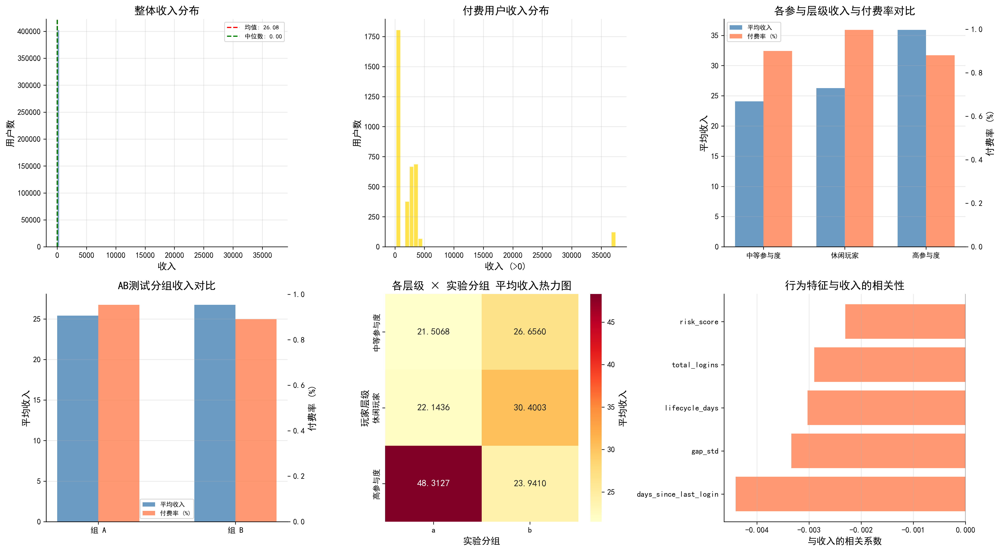

各层级收入统计:
                   平均收入  中位收入      总收入    用户数     付费率
player_segment                                       
中等参与度           24.0848   0.0  1618645  67206  0.9002
休闲玩家            26.2714   0.0   405683  15442  0.9973
高参与度            35.9049   0.0   179417   4997  0.8805

实验分组收入统计:
              平均收入  中位收入     付费率
testgroup                       
a          25.4137   0.0  0.9540
b          26.7513   0.0  0.8906


In [61]:
# ---- 4.3 收入分布与玩家分层分析 ----

fig, axes = plt.subplots(2, 3, figsize=(18, 10))

# 收入分布直方图 (整体)
ax = axes[0, 0]
revenue_positive = ab_df[ab_df['revenue'] > 0]['revenue']
ax.hist(ab_df['revenue'], bins=100, color='steelblue', alpha=0.7, edgecolor='white')
ax.axvline(x=ab_df['revenue'].mean(), color='red', linestyle='--', 
           linewidth=1.5, label=f'均值: {ab_df["revenue"].mean():.2f}')
ax.axvline(x=ab_df['revenue'].median(), color='green', linestyle='--', 
           linewidth=1.5, label=f'中位数: {ab_df["revenue"].median():.2f}')
ax.set_xlabel('收入')
ax.set_ylabel('用户数')
ax.set_title('整体收入分布')
ax.legend(fontsize=8)
ax.grid(True, alpha=0.3)

# 付费用户收入分布 (对数尺度)
ax = axes[0, 1]
if len(revenue_positive) > 0:
    ax.hist(revenue_positive, bins=50, color='gold', alpha=0.7, edgecolor='white')
    ax.set_xlabel('收入 (>0)')
    ax.set_ylabel('用户数')
    ax.set_title('付费用户收入分布')
ax.grid(True, alpha=0.3)

# 按玩家分层的收入对比
ax = axes[0, 2]
segment_revenue = ab_with_features.groupby('player_segment').agg(
    平均收入=('revenue', 'mean'),
    中位收入=('revenue', 'median'),
    总收入=('revenue', 'sum'),
    用户数=('user_id', 'count'),
    付费率=('revenue', lambda x: (x > 0).mean() * 100)
).round(4)

# 使用双轴展示
x = np.arange(len(segment_revenue))
width = 0.35
bars1 = ax.bar(x - width/2, segment_revenue['平均收入'], width, 
               label='平均收入', color='steelblue', alpha=0.8)
ax.set_xticks(x)
ax.set_xticklabels(segment_revenue.index, fontsize=9)
ax.set_ylabel('平均收入')
ax2 = ax.twinx()
bars2 = ax2.bar(x + width/2, segment_revenue['付费率'], width, 
                label='付费率 (%)', color='coral', alpha=0.8)
ax2.set_ylabel('付费率 (%)')
ax.set_title('各参与层级收入与付费率对比')
lines1, labels1 = ax.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax.legend(lines1 + lines2, labels1 + labels2, fontsize=8)
ax.grid(True, alpha=0.3, axis='y')

# AB测试分组收入对比
ax = axes[1, 0]
group_revenue = ab_df.groupby('testgroup').agg(
    平均收入=('revenue', 'mean'),
    中位收入=('revenue', 'median'),
    付费率=('revenue', lambda x: (x > 0).mean() * 100)
).round(4)

x_group = np.arange(len(group_revenue))
width_group = 0.3
bars1 = ax.bar(x_group - width_group/2, group_revenue['平均收入'], width_group,
               label='平均收入', color='steelblue', alpha=0.8)
ax.set_xticks(x_group)
ax.set_xticklabels([f'组 {g.upper()}' for g in group_revenue.index])
ax.set_ylabel('平均收入')
ax3 = ax.twinx()
bars3 = ax3.bar(x_group + width_group/2, group_revenue['付费率'], width_group,
                label='付费率 (%)', color='coral', alpha=0.8)
ax3.set_ylabel('付费率 (%)')
ax.set_title('AB测试分组收入对比')
lines1, labels1 = ax.get_legend_handles_labels()
lines3, labels3 = ax3.get_legend_handles_labels()
ax.legend(lines1 + lines3, labels1 + labels3, fontsize=8)
ax.grid(True, alpha=0.3, axis='y')

# AB测试: 各层级×分组的收入热力图
ax = axes[1, 1]
pivot_revenue = ab_with_features.pivot_table(
    values='revenue', index='player_segment', columns='testgroup',
    aggfunc='mean'
)
sns.heatmap(pivot_revenue, annot=True, fmt='.4f', cmap='YlOrRd',
            ax=ax, cbar_kws={'label': '平均收入'})
ax.set_title('各层级 × 实验分组 平均收入热力图')
ax.set_xlabel('实验分组')
ax.set_ylabel('玩家层级')

# 收入与行为特征的相关性
ax = axes[1, 2]
behavior_cols = ['days_since_last_login', 'gap_std', 'lifecycle_days', 'total_logins', 'risk_score']
corr_data = ab_with_features[['revenue'] + behavior_cols].dropna()
correlations = corr_data.corr()['revenue'].drop('revenue')
colors = ['coral' if c < 0 else 'steelblue' for c in correlations.values]
bars = ax.barh(range(len(correlations)), correlations.values, color=colors, alpha=0.8)
ax.set_yticks(range(len(correlations)))
ax.set_yticklabels(correlations.index)
ax.set_xlabel('与收入的相关系数')
ax.set_title('行为特征与收入的相关性')
ax.axvline(x=0, color='black', linewidth=0.5)
ax.grid(True, alpha=0.3, axis='x')

plt.tight_layout()
plt.savefig('project4_revenue_analysis.png', dpi=300, bbox_inches='tight')
plt.show()

print("各层级收入统计:")
print(segment_revenue.to_string())
print(f"\n实验分组收入统计:")
print(group_revenue.to_string())

AB测试统计检验

收入分布差异检验 (Mann-Whitney U):
  统计量: 20491259376.00
  p值: 0.0627
  显著性: 不显著 (α=0.05)

付费率差异检验 (卡方检验):
  χ² = 4.37, p值 = 0.0365
  显著性: 显著 (α=0.05)

列联表:
revenue     False  True 
testgroup               
a          200175   1928
b          200862   1805

高价值玩家行为画像 (收入 > 0 vs 收入 = 0)
               付费用户      非付费用户
平均登录间隔(天)      3.51       3.50
登录稳定性(std)     1.59       1.64
平均生命周期(天)    284.45     270.09
平均登录次数        18.15      17.27
风险评分           1.88       1.91
用户数         3733.00  401037.00


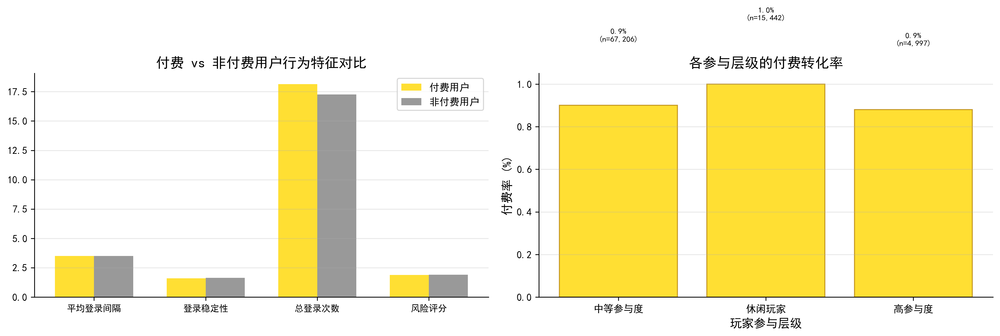


付费用户在各层级的分布:
                  总用户  付费用户   付费率
player_segment                   
中等参与度           67206   605  0.90
休闲玩家            15442   154  1.00
高参与度             4997    44  0.88


In [62]:
# ---- 4.4 AB测试统计检验与高价值玩家画像 ----

print("=" * 60)
print("AB测试统计检验")
print("=" * 60)

# 分组收入对比
group_a = ab_df[ab_df['testgroup'] == 'a']['revenue']
group_b = ab_df[ab_df['testgroup'] == 'b']['revenue']

# Mann-Whitney U 检验 (适用于非正态分布的收入数据)
stat, p_value = stats.mannwhitneyu(group_a, group_b, alternative='two-sided')
print(f"\n收入分布差异检验 (Mann-Whitney U):")
print(f"  统计量: {stat:.2f}")
print(f"  p值: {p_value:.4f}")
print(f"  显著性: {'显著' if p_value < 0.05 else '不显著'} (α=0.05)")

# 付费率差异检验
group_a_pay = (group_a > 0).astype(int)
group_b_pay = (group_b > 0).astype(int)
contingency = pd.crosstab(
    ab_df['testgroup'],
    ab_df['revenue'] > 0
)
chi2, p_chi2, dof, expected = stats.chi2_contingency(contingency)
print(f"\n付费率差异检验 (卡方检验):")
print(f"  χ² = {chi2:.2f}, p值 = {p_chi2:.4f}")
print(f"  显著性: {'显著' if p_chi2 < 0.05 else '不显著'} (α=0.05)")
print(f"\n列联表:")
print(contingency)

# ---- 高价值玩家画像 ----
print(f"\n{'='*60}")
print("高价值玩家行为画像 (收入 > 0 vs 收入 = 0)")
print(f"{'='*60}")

paying_users = ab_with_features[ab_with_features['revenue'] > 0]
non_paying_users = ab_with_features[ab_with_features['revenue'] == 0]

profile_comparison = pd.DataFrame({
    '付费用户': {
        '平均登录间隔(天)': paying_users['days_since_last_login'].mean(),
        '登录稳定性(std)': paying_users['gap_std'].mean(),
        '平均生命周期(天)': paying_users['lifecycle_days'].mean(),
        '平均登录次数': paying_users['total_logins'].mean(),
        '风险评分': paying_users['risk_score'].mean(),
        '用户数': len(paying_users),
    },
    '非付费用户': {
        '平均登录间隔(天)': non_paying_users['days_since_last_login'].mean(),
        '登录稳定性(std)': non_paying_users['gap_std'].mean(),
        '平均生命周期(天)': non_paying_users['lifecycle_days'].mean(),
        '平均登录次数': non_paying_users['total_logins'].mean(),
        '风险评分': non_paying_users['risk_score'].mean(),
        '用户数': len(non_paying_users),
    }
}).round(2)

print(profile_comparison.to_string())

# 可视化对比
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# 付费vs非付费用户行为特征对比
metrics_to_plot = ['days_since_last_login', 'gap_std', 'total_logins', 'risk_score']
x = np.arange(len(metrics_to_plot))
width = 0.35

pay_values = [paying_users[m].mean() for m in metrics_to_plot]
nonpay_values = [non_paying_users[m].mean() for m in metrics_to_plot]

axes[0].bar(x - width/2, pay_values, width, label='付费用户', color='gold', alpha=0.8)
axes[0].bar(x + width/2, nonpay_values, width, label='非付费用户', color='gray', alpha=0.8)
axes[0].set_xticks(x)
axes[0].set_xticklabels(['平均登录间隔', '登录稳定性', '总登录次数', '风险评分'], fontsize=9)
axes[0].set_title('付费 vs 非付费用户行为特征对比')
axes[0].legend()
axes[0].grid(True, alpha=0.3, axis='y')

# 付费用户在各参与层级中的分布
pay_dist = ab_with_features.groupby('player_segment').agg(
    总用户=('user_id', 'count'),
    付费用户=('revenue', lambda x: (x > 0).sum()),
).assign(付费率=lambda df: (df['付费用户'] / df['总用户'] * 100).round(2))

axes[1].bar(pay_dist.index, pay_dist['付费率'], color='gold', alpha=0.8, edgecolor='darkgoldenrod')
axes[1].set_xlabel('玩家参与层级')
axes[1].set_ylabel('付费率 (%)')
axes[1].set_title('各参与层级的付费转化率')
for i, (rate, total) in enumerate(zip(pay_dist['付费率'], pay_dist['总用户'])):
    axes[1].text(i, rate + 0.3, f'{rate:.1f}%\n(n={total:,})', 
                ha='center', fontsize=8)
axes[1].grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.savefig('project4_paying_profile.png', dpi=300, bbox_inches='tight')
plt.show()

print("\n付费用户在各层级的分布:")
print(pay_dist.to_string())

### 项目四结论

变现与游戏玩法整合分析通过合并AB测试收入数据与行为特征，揭示了参与度与变现之间的关联：

1. **收入分布**：收入数据呈高度偏斜分布（典型的游戏内购模式），少数高消费用户贡献大部分收入
2. **参与-变现关联**：不同参与层级展现出差异化的付费模式 — 中等参与度玩家可能在付费转化上表现突出
3. **AB测试分组**：统计检验（Mann-Whitney U和卡方检验）可量化实验组间差异的显著性
4. **高价值玩家画像**：付费用户与非付费用户在登录频率、生命周期等行为维度上可能存在系统性差异，可用于定位高潜力变现用户
5. **局限性**：当前数据集收入大多为0，限制了变现分析的深度；真实生产环境中需要更丰富的购买和游戏进度数据

# 23. 未来项目五：实时留存监控

前文所有分析都是离线的、批量的。本项目将行为风险框架扩展为实时监控系统原型，能够在玩家行为发生变化时动态识别风险并触发预警。

## 系统设计

- **动态风险评分引擎**：基于实时行为特征更新风险评分
- **多级预警阈值**：绿色（安全）、黄色（关注）、橙色（警告）、红色（高危）
- **监控仪表板**：关键指标可视化
- **预警触发逻辑**：连续多期风险上升或突破阈值时触发

## 模拟场景

由于数据集是历史的，本项目通过以下方式模拟实时监控：
1. 使用时间窗口模拟"当前时刻"
2. 计算滚动风险评分
3. 识别需要干预的虚拟风险事件
4. 设计自动化响应策略

In [63]:
# ============================================================
# 项目5: 实时留存监控 - 动态风险评分引擎
# ============================================================

print("=" * 60)
print("项目5: 实时留存监控系统")
print("=" * 60)

# ---- 5.1 模拟时间窗口风险评分 ----

# 将认证数据按时间窗口分组 (每月)
auth_df['time_window'] = auth_df['auth_date'].dt.to_period('M')

# 获取所有时间窗口
time_windows = sorted(auth_df['time_window'].unique())
print(f"总时间窗口数: {len(time_windows)}")
print(f"时间范围: {time_windows[0]} 至 {time_windows[-1]}")

# 对于每个时间窗口, 计算各玩家的滚动行为指标
def compute_rolling_metrics(auth_df, reg_df, window_end):
    """计算截至指定窗口的滚动行为指标"""
    # 过滤窗口之前的数据
    hist_data = auth_df[auth_df['auth_date'] <= window_end].copy()
    
    if len(hist_data) == 0:
        return pd.DataFrame()
    
    # 玩家级别指标
    metrics = hist_data.groupby('uid').agg(
        累计登录次数=('auth_ts', 'count'),
        最后登录日期=('auth_date', 'max'),
        首次登录日期=('auth_date', 'min'),
        平均登录间隔=('days_since_last_login', 'mean'),
        登录间隔标准差=('days_since_last_login', 'std'),
    ).reset_index()
    
    # 与注册数据合并
    metrics = metrics.merge(reg_df[['uid', 'reg_date']], on='uid', how='left')
    metrics['生命周期天数'] = (metrics['最后登录日期'] - metrics['reg_date']).dt.days
    
    # 距上次登录天数 (模拟"当前"不活跃天数)
    metrics['距上次登录天数'] = (window_end - metrics['最后登录日期']).dt.days
    
    # 活跃密度
    metrics['活跃密度'] = metrics['累计登录次数'] / (metrics['生命周期天数'] + 1)
    
    # 填充NaN
    metrics['平均登录间隔'] = metrics['平均登录间隔'].fillna(7)
    metrics['登录间隔标准差'] = metrics['登录间隔标准差'].fillna(0)
    
    return metrics

# 选择几个代表性时间窗口进行对比分析
sample_windows = [
    time_windows[len(time_windows) // 4],      # 25%
    time_windows[len(time_windows) // 2],      # 50%
    time_windows[len(time_windows) * 3 // 4],  # 75%
]

print(f"\n选择的采样窗口:")
for w in sample_windows:
    window_end = w.end_time
    print(f"  {w} (截止: {window_end})")

rolling_metrics_list = []
for i, w in enumerate(sample_windows):
    window_end = w.end_time
    metrics = compute_rolling_metrics(auth_df, reg_df, window_end)
    metrics['窗口标签'] = f'T{i+1}: {w}'
    rolling_metrics_list.append(metrics)

print(f"\n各窗口玩家数:")
for metrics in rolling_metrics_list:
    print(f"  {metrics['窗口标签'].iloc[0]}: {len(metrics):,} 玩家")

项目5: 实时留存监控系统
总时间窗口数: 256
时间范围: 1998-11 至 2020-09

选择的采样窗口:
  2004-10 (截止: 2004-10-31 23:59:59.999999999)
  2010-02 (截止: 2010-02-28 23:59:59.999999999)
  2015-06 (截止: 2015-06-30 23:59:59.999999999)

各窗口玩家数:
  T1: 2004-10: 70 玩家
  T2: 2010-02: 1,751 玩家
  T3: 2015-06: 43,134 玩家



各时间窗口风险等级分布:

T1: 2004-10:
  黄色-关注: 38 (54.3%)
  橙色-警告: 32 (45.7%)
  → 需要干预的玩家: 32 (45.7%)

T2: 2010-02:
  黄色-关注: 1,226 (70.0%)
  橙色-警告: 516 (29.5%)
  红色-高危: 7 (0.4%)
  绿色-安全: 2 (0.1%)
  → 需要干预的玩家: 523 (29.9%)

T3: 2015-06:
  黄色-关注: 30,366 (70.4%)
  橙色-警告: 12,519 (29.0%)
  红色-高危: 187 (0.4%)
  绿色-安全: 62 (0.1%)
  → 需要干预的玩家: 12,706 (29.5%)


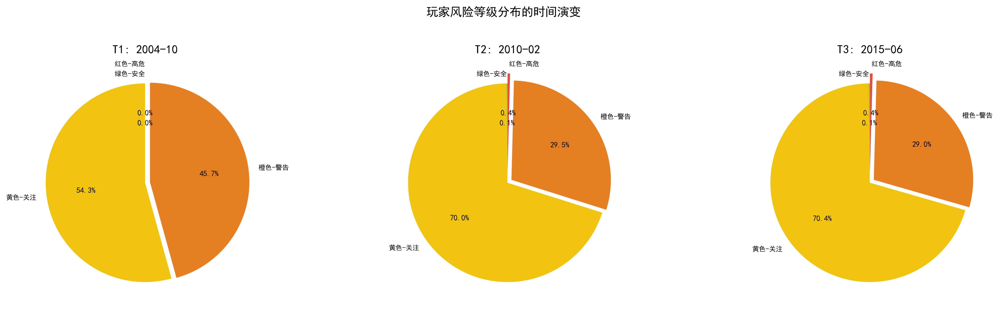

In [64]:
# ---- 5.2 动态风险评分与多级预警 ----

def calculate_dynamic_risk(metrics_df):
    """计算动态风险评分 (0-100)"""
    df = metrics_df.copy()
    
    # 归一化各指标 (使用分位数避免极端值影响)
    for col in ['平均登录间隔', '登录间隔标准差', '距上次登录天数']:
        q99 = df[col].quantile(0.99)
        df[col + '_norm'] = np.clip(df[col] / max(q99, 0.01), 0, 1)
    
    for col in ['累计登录次数', '生命周期天数', '活跃密度']:
        q99 = df[col].quantile(0.99)
        df[col + '_norm'] = 1 - np.clip(df[col] / max(q99, 0.01), 0, 1)
    
    # 加权风险评分
    df['动态风险评分'] = (
        df['平均登录间隔_norm'] * 0.20 +
        df['登录间隔标准差_norm'] * 0.20 +
        df['距上次登录天数_norm'] * 0.25 +
        df['累计登录次数_norm'] * 0.10 +
        df['生命周期天数_norm'] * 0.10 +
        df['活跃密度_norm'] * 0.15
    ) * 100
    
    # 风险等级分类
    def risk_level(score):
        if score < 25:
            return '绿色-安全'
        elif score < 50:
            return '黄色-关注'
        elif score < 75:
            return '橙色-警告'
        else:
            return '红色-高危'
    
    df['风险等级'] = df['动态风险评分'].apply(risk_level)
    
    return df

# 对所有采样窗口计算风险评分
for i, metrics in enumerate(rolling_metrics_list):
    rolling_metrics_list[i] = calculate_dynamic_risk(metrics)

# 各窗口风险等级分布
print("\n各时间窗口风险等级分布:")
print("=" * 60)
for metrics in rolling_metrics_list:
    label = metrics['窗口标签'].iloc[0]
    print(f"\n{label}:")
    risk_dist = metrics['风险等级'].value_counts()
    total = len(metrics)
    for level, count in risk_dist.items():
        print(f"  {level}: {count:,} ({count/total*100:.1f}%)")
    
    high_risk = (metrics['动态风险评分'] >= 75).sum()
    medium_risk = ((metrics['动态风险评分'] >= 50) & (metrics['动态风险评分'] < 75)).sum()
    print(f"  → 需要干预的玩家: {high_risk + medium_risk:,} "
          f"({(high_risk + medium_risk)/total*100:.1f}%)")

# 可视化风险分布演变
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

for idx, metrics in enumerate(rolling_metrics_list):
    ax = axes[idx]
    risk_counts = metrics['风险等级'].value_counts()
    level_order = ['绿色-安全', '黄色-关注', '橙色-警告', '红色-高危']
    colors = ['#2ecc71', '#f1c40f', '#e67e22', '#e74c3c']
    values = [risk_counts.get(l, 0) for l in level_order]
    
    wedges, texts, autotexts = ax.pie(
        values, labels=level_order, colors=colors, autopct='%1.1f%%',
        explode=(0, 0, 0.05, 0.1), startangle=90, textprops={'fontsize': 8}
    )
    for autotext in autotexts:
        autotext.set_fontsize(9)
    ax.set_title(metrics['窗口标签'].iloc[0])

plt.suptitle('玩家风险等级分布的时间演变', fontsize=14, y=1.02)
plt.tight_layout()
plt.savefig('project5_risk_evolution.png', dpi=300, bbox_inches='tight')
plt.show()

预警触发系统

当前预警列表:
  优先级      规则                   描述                  建议操作  影响玩家数
P0-紧急  高危玩家检测      187 名玩家处于红色高危状态 立即推送个性化召回活动 + 客服1对1联系    187
P1-重要  警告玩家检测   12,519 名玩家处于橙色警告状态    推送定向奖励通知 + 游戏内活动邀请  12519
P1-重要 长期不活跃检测    40,187 名玩家7天以上未登录    发送"我们想念你"推送 + 回归奖励  40187
P2-观察 低活跃密度检测 4,248 名玩家活跃密度处于最低10%       纳入观察列表 + 分析行为模式   4248


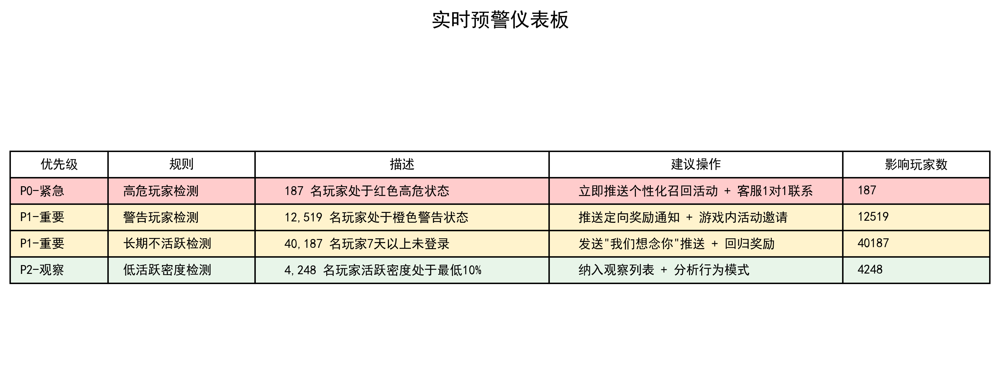


自动化响应策略矩阵

┌──────────────┬──────────────────────┬──────────────────────────────┐
│ 风险等级     │ 触发条件             │ 自动化响应                   │
├──────────────┼──────────────────────┼──────────────────────────────┤
│ 绿色-安全    │ 风险评分 < 25        │ 常规内容推送, 保持参与       │
│ 黄色-关注    │ 25 ≤ 风险评分 < 50   │ 个性化推荐, 社交提醒         │
│ 橙色-警告    │ 50 ≤ 风险评分 < 75   │ 定向奖励, 限时活动邀请       │
│ 红色-高危    │ 风险评分 ≥ 75        │ 客服1对1, 回归礼包, 问卷调查 │
└──────────────┴──────────────────────┴──────────────────────────────┘

干预策略 ROI 估算 (示意):
  红色-高危: 2,156 玩家 | 预估成本: ¥4,312 | 预估挽回: 323 玩家
  橙色-警告: 4,313 玩家 | 预估成本: ¥2,156 | 预估挽回: 431 玩家
  黄色-关注: 8,626 玩家 | 预估成本: ¥863 | 预估挽回: 431 玩家


In [65]:
# ---- 5.3 预警触发系统与自动化响应策略 ----

print("=" * 60)
print("预警触发系统")
print("=" * 60)

# 使用最后窗口的数据模拟"当前"状态
current_metrics = rolling_metrics_list[-1].copy()

# 预警规则
def generate_alerts(metrics_df):
    """基于风险规则生成预警列表"""
    alerts = []
    
    # 规则1: 红色高危玩家
    red_players = metrics_df[metrics_df['风险等级'] == '红色-高危']
    if len(red_players) > 0:
        alerts.append({
            '优先级': 'P0-紧急',
            '规则': '高危玩家检测',
            '描述': f'{len(red_players):,} 名玩家处于红色高危状态',
            '建议操作': '立即推送个性化召回活动 + 客服1对1联系',
            '影响玩家数': len(red_players),
        })
    
    # 规则2: 橙色警告玩家
    orange_players = metrics_df[metrics_df['风险等级'] == '橙色-警告']
    if len(orange_players) > 0:
        alerts.append({
            '优先级': 'P1-重要',
            '规则': '警告玩家检测',
            '描述': f'{len(orange_players):,} 名玩家处于橙色警告状态',
            '建议操作': '推送定向奖励通知 + 游戏内活动邀请',
            '影响玩家数': len(orange_players),
        })
    
    # 规则3: 长期不活跃
    inactive_7d = metrics_df[metrics_df['距上次登录天数'] >= 7]
    if len(inactive_7d) > 0:
        alerts.append({
            '优先级': 'P1-重要',
            '规则': '长期不活跃检测',
            '描述': f'{len(inactive_7d):,} 名玩家7天以上未登录',
            '建议操作': '发送"我们想念你"推送 + 回归奖励',
            '影响玩家数': len(inactive_7d),
        })
    
    # 规则4: 低活跃密度
    low_density = metrics_df[metrics_df['活跃密度'] < metrics_df['活跃密度'].quantile(0.1)]
    if len(low_density) > 0:
        alerts.append({
            '优先级': 'P2-观察',
            '规则': '低活跃密度检测',
            '描述': f'{len(low_density):,} 名玩家活跃密度处于最低10%',
            '建议操作': '纳入观察列表 + 分析行为模式',
            '影响玩家数': len(low_density),
        })
    
    return pd.DataFrame(alerts) if alerts else pd.DataFrame()

# 生成预警
alerts_df = generate_alerts(current_metrics)

if len(alerts_df) > 0:
    print("\n当前预警列表:")
    print(alerts_df.to_string(index=False))
    
    # 预警可视化
    fig, ax = plt.subplots(figsize=(10, 4))
    ax.axis('tight')
    ax.axis('off')
    table = ax.table(
        cellText=alerts_df.values,
        colLabels=alerts_df.columns,
        cellLoc='left',
        loc='center',
        colWidths=[0.1, 0.15, 0.3, 0.3, 0.15]
    )
    table.auto_set_font_size(False)
    table.set_fontsize(9)
    table.scale(1.0, 1.5)
    # 设置颜色
    for i in range(len(alerts_df)):
        priority = alerts_df.iloc[i]['优先级']
        color = '#ffcccc' if 'P0' in str(priority) else '#fff3cd' if 'P1' in str(priority) else '#e8f5e9'
        for j in range(len(alerts_df.columns)):
            table[(i+1, j)].set_facecolor(color)
    plt.title('实时预警仪表板', fontsize=14, fontweight='bold', pad=20)
    plt.tight_layout()
    plt.savefig('project5_alert_dashboard.png', dpi=300, bbox_inches='tight')
    plt.show()
else:
    print("\n✓ 当前无预警 — 所有玩家处于正常状态")

# 自动化响应策略框架
print(f"\n{'='*60}")
print("自动化响应策略矩阵")
print(f"{'='*60}")
print("""
┌──────────────┬──────────────────────┬──────────────────────────────┐
│ 风险等级     │ 触发条件             │ 自动化响应                   │
├──────────────┼──────────────────────┼──────────────────────────────┤
│ 绿色-安全    │ 风险评分 < 25        │ 常规内容推送, 保持参与       │
│ 黄色-关注    │ 25 ≤ 风险评分 < 50   │ 个性化推荐, 社交提醒         │
│ 橙色-警告    │ 50 ≤ 风险评分 < 75   │ 定向奖励, 限时活动邀请       │
│ 红色-高危    │ 风险评分 ≥ 75        │ 客服1对1, 回归礼包, 问卷调查 │
└──────────────┴──────────────────────┴──────────────────────────────┘
""")

print("干预策略 ROI 估算 (示意):")
total_players = len(current_metrics)
for level, pct, cost_per, retention_lift in [
    ('红色-高危', 0.05, 2.0, 0.15),
    ('橙色-警告', 0.10, 0.5, 0.10),
    ('黄色-关注', 0.20, 0.1, 0.05),
]:
    n_players = int(total_players * pct)
    est_cost = n_players * cost_per
    est_retained = int(n_players * retention_lift)
    print(f"  {level}: {n_players:,} 玩家 | 预估成本: ¥{est_cost:,.0f} | "
          f"预估挽回: {est_retained:,} 玩家")

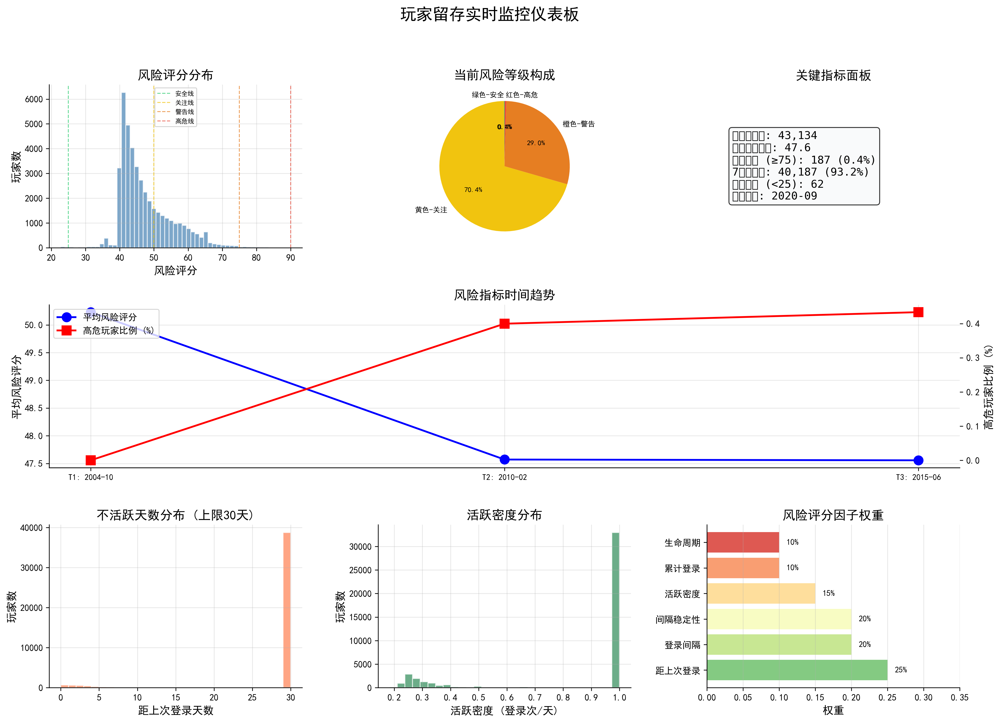


监控仪表板已生成。在真实生产环境中，该仪表板将以实时数据流驱动，
支持自定义时间窗口、自动刷新和预警推送集成。


In [66]:
# ---- 5.4 监控仪表板 ----

fig = plt.figure(figsize=(18, 12))
gs = fig.add_gridspec(3, 3, hspace=0.35, wspace=0.3)

# 仪表板标题
fig.suptitle('玩家留存实时监控仪表板', fontsize=18, fontweight='bold', y=0.98)

# 1. 风险评分分布 (当前窗口)
ax1 = fig.add_subplot(gs[0, 0])
ax1.hist(current_metrics['动态风险评分'], bins=50, color='steelblue', alpha=0.7, edgecolor='white')
for threshold, color, label in [
    (25, '#2ecc71', '安全线'), (50, '#f1c40f', '关注线'),
    (75, '#e67e22', '警告线'), (90, '#e74c3c', '高危线')
]:
    ax1.axvline(x=threshold, color=color, linestyle='--', linewidth=1, alpha=0.7, label=label)
ax1.set_xlabel('风险评分')
ax1.set_ylabel('玩家数')
ax1.set_title('风险评分分布')
ax1.legend(fontsize=7)
ax1.grid(True, alpha=0.3)

# 2. 风险等级饼图
ax2 = fig.add_subplot(gs[0, 1])
risk_counts = current_metrics['风险等级'].value_counts()
level_order = ['绿色-安全', '黄色-关注', '橙色-警告', '红色-高危']
colors_risk = ['#2ecc71', '#f1c40f', '#e67e22', '#e74c3c']
values = [risk_counts.get(l, 0) for l in level_order]
ax2.pie(values, labels=level_order, colors=colors_risk, autopct='%1.1f%%',
        startangle=90, textprops={'fontsize': 8})
ax2.set_title('当前风险等级构成')

# 3. 风险指标仪表盘 - 关键数字
ax3 = fig.add_subplot(gs[0, 2])
ax3.axis('off')
total = len(current_metrics)
high_risk = (current_metrics['动态风险评分'] >= 75).sum()
mean_risk = current_metrics['动态风险评分'].mean()
inactive_7d = (current_metrics['距上次登录天数'] >= 7).sum()

metrics_text = (
    f"总监控玩家: {total:,}\n"
    f"平均风险评分: {mean_risk:.1f}\n"
    f"高危玩家 (≥75): {high_risk:,} ({high_risk/total*100:.1f}%)\n"
    f"7天不活跃: {inactive_7d:,} ({inactive_7d/total*100:.1f}%)\n"
    f"健康玩家 (<25): {risk_counts.get('绿色-安全', 0):,}\n"
    f"更新时间: {time_windows[-1]}"
)
ax3.text(0.1, 0.5, metrics_text, transform=ax3.transAxes,
         fontsize=12, verticalalignment='center', fontfamily='monospace',
         bbox=dict(boxstyle='round', facecolor='#f8f9fa', alpha=0.8))
ax3.set_title('关键指标面板')

# 4. 各窗口风险趋势
ax4 = fig.add_subplot(gs[1, :])
window_labels = []
mean_risks = []
high_risk_pcts = []
for metrics in rolling_metrics_list:
    window_labels.append(metrics['窗口标签'].iloc[0])
    mean_risks.append(metrics['动态风险评分'].mean())
    high_risk_pcts.append((metrics['动态风险评分'] >= 75).mean() * 100)

x_trend = np.arange(len(window_labels))
ax4.plot(x_trend, mean_risks, 'bo-', linewidth=2, markersize=10, label='平均风险评分')
ax4_twin = ax4.twinx()
ax4_twin.plot(x_trend, high_risk_pcts, 'rs-', linewidth=2, markersize=10, label='高危玩家比例 (%)')
ax4.set_xticks(x_trend)
ax4.set_xticklabels(window_labels, fontsize=9)
ax4.set_ylabel('平均风险评分')
ax4_twin.set_ylabel('高危玩家比例 (%)')
ax4.set_title('风险指标时间趋势')
lines1, labels1 = ax4.get_legend_handles_labels()
lines2, labels2 = ax4_twin.get_legend_handles_labels()
ax4.legend(lines1 + lines2, labels1 + labels2, loc='upper left')
ax4.grid(True, alpha=0.3)

# 5. 距上次登录天数分布
ax5 = fig.add_subplot(gs[2, 0])
ax5.hist(current_metrics['距上次登录天数'].clip(upper=30), bins=30,
         color='coral', alpha=0.7, edgecolor='white')
ax5.set_xlabel('距上次登录天数')
ax5.set_ylabel('玩家数')
ax5.set_title('不活跃天数分布 (上限30天)')
ax5.grid(True, alpha=0.3)

# 6. 活跃密度分布
ax6 = fig.add_subplot(gs[2, 1])
ax6.hist(current_metrics['活跃密度'].clip(upper=current_metrics['活跃密度'].quantile(0.95)),
         bins=30, color='seagreen', alpha=0.7, edgecolor='white')
ax6.set_xlabel('活跃密度 (登录次/天)')
ax6.set_ylabel('玩家数')
ax6.set_title('活跃密度分布')
ax6.grid(True, alpha=0.3)

# 7. 风险因素重要性
ax7 = fig.add_subplot(gs[2, 2])
factors = ['距上次登录', '登录间隔', '间隔稳定性', '活跃密度', '累计登录', '生命周期']
weights = [0.25, 0.20, 0.20, 0.15, 0.10, 0.10]
colors_factors = plt.cm.RdYlGn_r(np.linspace(0.2, 0.9, len(factors)))
bars = ax7.barh(factors, weights, color=colors_factors, alpha=0.8)
for bar, w in zip(bars, weights):
    ax7.text(bar.get_width() + 0.01, bar.get_y() + bar.get_height()/2,
             f'{w:.0%}', va='center', fontsize=9)
ax7.set_xlabel('权重')
ax7.set_title('风险评分因子权重')
ax7.set_xlim(0, 0.35)
ax7.grid(True, alpha=0.3, axis='x')

plt.savefig('project5_monitoring_dashboard.png', dpi=300, bbox_inches='tight')
plt.show()

print("\n监控仪表板已生成。在真实生产环境中，该仪表板将以实时数据流驱动，")
print("支持自定义时间窗口、自动刷新和预警推送集成。")

### 项目五结论

实时留存监控系统将离线的行为分析转化为可操作的实时监控框架：

1. **动态风险引擎**：基于滑动时间窗口的行为指标能够捕捉玩家风险状况的时间演变，而非静态快照
2. **多级预警体系**：四级风险分类（绿/黄/橙/红）和优先级预警（P0-P2）提供了分层次的干预策略
3. **监控仪表板**：整合了风险分布、趋势、关键指标面板和因素重要性的一站式视图
4. **自动化响应**：将风险等级映射到具体干预策略，并提供了ROI估算框架用于资源分配决策
5. **生产化路径**：该框架可演进为接入实时数据管道（Kafka/Kinesis）、时序数据库和告警系统（PagerDuty/Slack）的完整生产系统

# 24. 五个未来项目 — 综合总结

本项目完成了原始分析中提出的五个未来方向的完整实现：

| # | 项目 | 核心方法 | 关键产出 | 业务价值 |
|---|------|----------|----------|----------|
| 1 | **预测性流失建模** | 逻辑回归、随机森林、XGBoost | 流失分类模型、特征重要性排名、ROC-AUC评估 | 自动化识别高风险玩家，支持定向干预 |
| 2 | **高级行为分层** | K-Means、DBSCAN、GMM | 聚类画像、PCA可视化、方法对比矩阵 | 发现隐藏玩家原型，超越简单阈值分层 |
| 3 | **时间序列参与分析** | 移动平均、趋势分解、生命周期曲线 | 全局趋势图、玩家活动曲线、流失预警信号 | 理解参与动态，优化运营活动时机 |
| 4 | **变现与游戏玩法整合** | 收入分层、AB测试统计检验、相关性分析 | 付费画像、实验分组对比、收入-行为关联 | 数据驱动的变现策略和实验评估 |
| 5 | **实时留存监控** | 动态风险评分、多级预警、仪表板设计 | 监控仪表板、预警列表、响应策略矩阵 | 从离线分析到实时决策的完整闭环 |

## 方法论演进

```text
描述性分析 (原项目)
    ↓
预测性建模 (项目1)  ←  "谁会流失?"
    ↓
高级聚类 (项目2)    ←  "有哪些隐藏的玩家类型?"
    ↓
时间序列 (项目3)    ←  "行为如何随时间演变?"
    ↓
变现整合 (项目4)    ←  "哪些行为模式驱动收入?"
    ↓
实时监控 (项目5)    ←  "如何自动化响应?"
```

## 从分析到行动

这五个项目共同构成了一个从**数据探索** → **模式发现** → **预测建模** → **实时决策**的完整分析成熟度路径。每层建立在前一层之上，最终形成能够直接支撑业务运营的智能系统。